# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [1]:
# run this once to unzip the file
!unzip processed-celeba-small.zip

Archive:  processed-celeba-small.zip
   creating: processed_celeba_small/
  inflating: processed_celeba_small/.DS_Store  
   creating: __MACOSX/
   creating: __MACOSX/processed_celeba_small/
  inflating: __MACOSX/processed_celeba_small/._.DS_Store  
   creating: processed_celeba_small/celeba/
  inflating: processed_celeba_small/celeba/.DS_Store  
   creating: __MACOSX/processed_celeba_small/celeba/
  inflating: __MACOSX/processed_celeba_small/celeba/._.DS_Store  
  inflating: processed_celeba_small/celeba/161979.jpg  
  inflating: processed_celeba_small/celeba/161980.jpg  
  inflating: processed_celeba_small/celeba/161981.jpg  
  inflating: processed_celeba_small/celeba/161982.jpg  
  inflating: processed_celeba_small/celeba/161983.jpg  
  inflating: processed_celeba_small/celeba/161984.jpg  
  inflating: processed_celeba_small/celeba/161985.jpg  
  inflating: processed_celeba_small/celeba/161986.jpg  
  inflating: processed_celeba_small/celeba/161987.jpg  
  inflating: processed_celeb

  inflating: processed_celeba_small/celeba/162340.jpg  
  inflating: processed_celeba_small/celeba/162341.jpg  
  inflating: processed_celeba_small/celeba/162342.jpg  
  inflating: processed_celeba_small/celeba/162343.jpg  
  inflating: processed_celeba_small/celeba/162344.jpg  
  inflating: processed_celeba_small/celeba/162345.jpg  
  inflating: processed_celeba_small/celeba/162346.jpg  
  inflating: processed_celeba_small/celeba/162347.jpg  
  inflating: processed_celeba_small/celeba/162348.jpg  
  inflating: processed_celeba_small/celeba/162349.jpg  
  inflating: processed_celeba_small/celeba/162350.jpg  
  inflating: processed_celeba_small/celeba/162351.jpg  
  inflating: processed_celeba_small/celeba/162352.jpg  
  inflating: processed_celeba_small/celeba/162353.jpg  
  inflating: processed_celeba_small/celeba/162354.jpg  
  inflating: processed_celeba_small/celeba/162355.jpg  
  inflating: processed_celeba_small/celeba/162356.jpg  
  inflating: processed_celeba_small/celeba/16235

  inflating: processed_celeba_small/celeba/162777.jpg  
  inflating: processed_celeba_small/celeba/162778.jpg  
  inflating: processed_celeba_small/celeba/162779.jpg  
  inflating: processed_celeba_small/celeba/162780.jpg  
  inflating: processed_celeba_small/celeba/162781.jpg  
  inflating: processed_celeba_small/celeba/162782.jpg  
  inflating: processed_celeba_small/celeba/162783.jpg  
  inflating: processed_celeba_small/celeba/162784.jpg  
  inflating: processed_celeba_small/celeba/162785.jpg  
  inflating: processed_celeba_small/celeba/162786.jpg  
  inflating: processed_celeba_small/celeba/162787.jpg  
  inflating: processed_celeba_small/celeba/162788.jpg  
  inflating: processed_celeba_small/celeba/162789.jpg  
  inflating: processed_celeba_small/celeba/162790.jpg  
  inflating: processed_celeba_small/celeba/162791.jpg  
  inflating: processed_celeba_small/celeba/162792.jpg  
  inflating: processed_celeba_small/celeba/162793.jpg  
  inflating: processed_celeba_small/celeba/16279

  inflating: processed_celeba_small/celeba/163341.jpg  
  inflating: processed_celeba_small/celeba/163342.jpg  
  inflating: processed_celeba_small/celeba/163343.jpg  
  inflating: processed_celeba_small/celeba/163344.jpg  
  inflating: processed_celeba_small/celeba/163345.jpg  
  inflating: processed_celeba_small/celeba/163346.jpg  
  inflating: processed_celeba_small/celeba/163347.jpg  
  inflating: processed_celeba_small/celeba/163348.jpg  
  inflating: processed_celeba_small/celeba/163349.jpg  
  inflating: processed_celeba_small/celeba/163350.jpg  
  inflating: processed_celeba_small/celeba/163351.jpg  
  inflating: processed_celeba_small/celeba/163352.jpg  
  inflating: processed_celeba_small/celeba/163353.jpg  
  inflating: processed_celeba_small/celeba/163354.jpg  
  inflating: processed_celeba_small/celeba/163355.jpg  
  inflating: processed_celeba_small/celeba/163356.jpg  
  inflating: processed_celeba_small/celeba/163357.jpg  
  inflating: processed_celeba_small/celeba/16335

  inflating: processed_celeba_small/celeba/163665.jpg  
  inflating: processed_celeba_small/celeba/163666.jpg  
  inflating: processed_celeba_small/celeba/163667.jpg  
  inflating: processed_celeba_small/celeba/163668.jpg  
  inflating: processed_celeba_small/celeba/163669.jpg  
  inflating: processed_celeba_small/celeba/163670.jpg  
  inflating: processed_celeba_small/celeba/163671.jpg  
  inflating: processed_celeba_small/celeba/163672.jpg  
  inflating: processed_celeba_small/celeba/163673.jpg  
  inflating: processed_celeba_small/celeba/163674.jpg  
  inflating: processed_celeba_small/celeba/163675.jpg  
  inflating: processed_celeba_small/celeba/163676.jpg  
  inflating: processed_celeba_small/celeba/163677.jpg  
  inflating: processed_celeba_small/celeba/163678.jpg  
  inflating: processed_celeba_small/celeba/163679.jpg  
  inflating: processed_celeba_small/celeba/163680.jpg  
  inflating: processed_celeba_small/celeba/163681.jpg  
  inflating: processed_celeba_small/celeba/16368

  inflating: processed_celeba_small/celeba/164226.jpg  
  inflating: processed_celeba_small/celeba/164227.jpg  
  inflating: processed_celeba_small/celeba/164228.jpg  
  inflating: processed_celeba_small/celeba/164229.jpg  
  inflating: processed_celeba_small/celeba/164230.jpg  
  inflating: processed_celeba_small/celeba/164231.jpg  
  inflating: processed_celeba_small/celeba/164232.jpg  
  inflating: processed_celeba_small/celeba/164233.jpg  
  inflating: processed_celeba_small/celeba/164234.jpg  
  inflating: processed_celeba_small/celeba/164235.jpg  
  inflating: processed_celeba_small/celeba/164236.jpg  
  inflating: processed_celeba_small/celeba/164237.jpg  
  inflating: processed_celeba_small/celeba/164238.jpg  
  inflating: processed_celeba_small/celeba/164239.jpg  
  inflating: processed_celeba_small/celeba/164240.jpg  
  inflating: processed_celeba_small/celeba/164241.jpg  
  inflating: processed_celeba_small/celeba/164242.jpg  
  inflating: processed_celeba_small/celeba/16424

  inflating: processed_celeba_small/celeba/164572.jpg  
  inflating: processed_celeba_small/celeba/164573.jpg  
  inflating: processed_celeba_small/celeba/164574.jpg  
  inflating: processed_celeba_small/celeba/164575.jpg  
  inflating: processed_celeba_small/celeba/164576.jpg  
  inflating: processed_celeba_small/celeba/164577.jpg  
  inflating: processed_celeba_small/celeba/164578.jpg  
  inflating: processed_celeba_small/celeba/164579.jpg  
  inflating: processed_celeba_small/celeba/164580.jpg  
  inflating: processed_celeba_small/celeba/164581.jpg  
  inflating: processed_celeba_small/celeba/164582.jpg  
  inflating: processed_celeba_small/celeba/164583.jpg  
  inflating: processed_celeba_small/celeba/164584.jpg  
  inflating: processed_celeba_small/celeba/164585.jpg  
  inflating: processed_celeba_small/celeba/164586.jpg  
  inflating: processed_celeba_small/celeba/164587.jpg  
  inflating: processed_celeba_small/celeba/164588.jpg  
  inflating: processed_celeba_small/celeba/16458

  inflating: processed_celeba_small/celeba/165131.jpg  
  inflating: processed_celeba_small/celeba/165132.jpg  
  inflating: processed_celeba_small/celeba/165133.jpg  
  inflating: processed_celeba_small/celeba/165134.jpg  
  inflating: processed_celeba_small/celeba/165135.jpg  
  inflating: processed_celeba_small/celeba/165136.jpg  
  inflating: processed_celeba_small/celeba/165137.jpg  
  inflating: processed_celeba_small/celeba/165138.jpg  
  inflating: processed_celeba_small/celeba/165139.jpg  
  inflating: processed_celeba_small/celeba/165140.jpg  
  inflating: processed_celeba_small/celeba/165141.jpg  
  inflating: processed_celeba_small/celeba/165142.jpg  
  inflating: processed_celeba_small/celeba/165143.jpg  
  inflating: processed_celeba_small/celeba/165144.jpg  
  inflating: processed_celeba_small/celeba/165145.jpg  
  inflating: processed_celeba_small/celeba/165146.jpg  
  inflating: processed_celeba_small/celeba/165147.jpg  
  inflating: processed_celeba_small/celeba/16514

  inflating: processed_celeba_small/celeba/165481.jpg  
  inflating: processed_celeba_small/celeba/165482.jpg  
  inflating: processed_celeba_small/celeba/165483.jpg  
  inflating: processed_celeba_small/celeba/165484.jpg  
  inflating: processed_celeba_small/celeba/165485.jpg  
  inflating: processed_celeba_small/celeba/165486.jpg  
  inflating: processed_celeba_small/celeba/165487.jpg  
  inflating: processed_celeba_small/celeba/165488.jpg  
  inflating: processed_celeba_small/celeba/165489.jpg  
  inflating: processed_celeba_small/celeba/165490.jpg  
  inflating: processed_celeba_small/celeba/165491.jpg  
  inflating: processed_celeba_small/celeba/165492.jpg  
  inflating: processed_celeba_small/celeba/165493.jpg  
  inflating: processed_celeba_small/celeba/165494.jpg  
  inflating: processed_celeba_small/celeba/165495.jpg  
  inflating: processed_celeba_small/celeba/165496.jpg  
  inflating: processed_celeba_small/celeba/165497.jpg  
  inflating: processed_celeba_small/celeba/16549

  inflating: processed_celeba_small/celeba/166045.jpg  
  inflating: processed_celeba_small/celeba/166046.jpg  
  inflating: processed_celeba_small/celeba/166047.jpg  
  inflating: processed_celeba_small/celeba/166048.jpg  
  inflating: processed_celeba_small/celeba/166049.jpg  
  inflating: processed_celeba_small/celeba/166050.jpg  
  inflating: processed_celeba_small/celeba/166051.jpg  
  inflating: processed_celeba_small/celeba/166052.jpg  
  inflating: processed_celeba_small/celeba/166053.jpg  
  inflating: processed_celeba_small/celeba/166054.jpg  
  inflating: processed_celeba_small/celeba/166055.jpg  
  inflating: processed_celeba_small/celeba/166056.jpg  
  inflating: processed_celeba_small/celeba/166057.jpg  
  inflating: processed_celeba_small/celeba/166058.jpg  
  inflating: processed_celeba_small/celeba/166059.jpg  
  inflating: processed_celeba_small/celeba/166060.jpg  
  inflating: processed_celeba_small/celeba/166061.jpg  
  inflating: processed_celeba_small/celeba/16606

  inflating: processed_celeba_small/celeba/166235.jpg  
  inflating: processed_celeba_small/celeba/166236.jpg  
  inflating: processed_celeba_small/celeba/166237.jpg  
  inflating: processed_celeba_small/celeba/166238.jpg  
  inflating: processed_celeba_small/celeba/166239.jpg  
  inflating: processed_celeba_small/celeba/166240.jpg  
  inflating: processed_celeba_small/celeba/166241.jpg  
  inflating: processed_celeba_small/celeba/166242.jpg  
  inflating: processed_celeba_small/celeba/166243.jpg  
  inflating: processed_celeba_small/celeba/166244.jpg  
  inflating: processed_celeba_small/celeba/166245.jpg  
  inflating: processed_celeba_small/celeba/166246.jpg  
  inflating: processed_celeba_small/celeba/166247.jpg  
  inflating: processed_celeba_small/celeba/166248.jpg  
  inflating: processed_celeba_small/celeba/166249.jpg  
  inflating: processed_celeba_small/celeba/166250.jpg  
  inflating: processed_celeba_small/celeba/166251.jpg  
  inflating: processed_celeba_small/celeba/16625

  inflating: processed_celeba_small/celeba/166477.jpg  
  inflating: processed_celeba_small/celeba/166478.jpg  
  inflating: processed_celeba_small/celeba/166479.jpg  
  inflating: processed_celeba_small/celeba/166480.jpg  
  inflating: processed_celeba_small/celeba/166481.jpg  
  inflating: processed_celeba_small/celeba/166482.jpg  
  inflating: processed_celeba_small/celeba/166483.jpg  
  inflating: processed_celeba_small/celeba/166484.jpg  
  inflating: processed_celeba_small/celeba/166485.jpg  
  inflating: processed_celeba_small/celeba/166486.jpg  
  inflating: processed_celeba_small/celeba/166487.jpg  
  inflating: processed_celeba_small/celeba/166488.jpg  
  inflating: processed_celeba_small/celeba/166489.jpg  
  inflating: processed_celeba_small/celeba/166490.jpg  
  inflating: processed_celeba_small/celeba/166491.jpg  
  inflating: processed_celeba_small/celeba/166492.jpg  
  inflating: processed_celeba_small/celeba/166493.jpg  
  inflating: processed_celeba_small/celeba/16649

  inflating: processed_celeba_small/celeba/167015.jpg  
  inflating: processed_celeba_small/celeba/167016.jpg  
  inflating: processed_celeba_small/celeba/167017.jpg  
  inflating: processed_celeba_small/celeba/167018.jpg  
  inflating: processed_celeba_small/celeba/167019.jpg  
  inflating: processed_celeba_small/celeba/167020.jpg  
  inflating: processed_celeba_small/celeba/167021.jpg  
  inflating: processed_celeba_small/celeba/167022.jpg  
  inflating: processed_celeba_small/celeba/167023.jpg  
  inflating: processed_celeba_small/celeba/167024.jpg  
  inflating: processed_celeba_small/celeba/167025.jpg  
  inflating: processed_celeba_small/celeba/167026.jpg  
  inflating: processed_celeba_small/celeba/167027.jpg  
  inflating: processed_celeba_small/celeba/167028.jpg  
  inflating: processed_celeba_small/celeba/167029.jpg  
  inflating: processed_celeba_small/celeba/167030.jpg  
  inflating: processed_celeba_small/celeba/167031.jpg  
  inflating: processed_celeba_small/celeba/16703

  inflating: processed_celeba_small/celeba/167578.jpg  
  inflating: processed_celeba_small/celeba/167579.jpg  
  inflating: processed_celeba_small/celeba/167580.jpg  
  inflating: processed_celeba_small/celeba/167581.jpg  
  inflating: processed_celeba_small/celeba/167582.jpg  
  inflating: processed_celeba_small/celeba/167583.jpg  
  inflating: processed_celeba_small/celeba/167584.jpg  
  inflating: processed_celeba_small/celeba/167585.jpg  
  inflating: processed_celeba_small/celeba/167586.jpg  
  inflating: processed_celeba_small/celeba/167587.jpg  
  inflating: processed_celeba_small/celeba/167588.jpg  
  inflating: processed_celeba_small/celeba/167589.jpg  
  inflating: processed_celeba_small/celeba/167590.jpg  
  inflating: processed_celeba_small/celeba/167591.jpg  
  inflating: processed_celeba_small/celeba/167592.jpg  
  inflating: processed_celeba_small/celeba/167593.jpg  
  inflating: processed_celeba_small/celeba/167594.jpg  
  inflating: processed_celeba_small/celeba/16759

  inflating: processed_celeba_small/celeba/167916.jpg  
  inflating: processed_celeba_small/celeba/167917.jpg  
  inflating: processed_celeba_small/celeba/167918.jpg  
  inflating: processed_celeba_small/celeba/167919.jpg  
  inflating: processed_celeba_small/celeba/167920.jpg  
  inflating: processed_celeba_small/celeba/167921.jpg  
  inflating: processed_celeba_small/celeba/167922.jpg  
  inflating: processed_celeba_small/celeba/167923.jpg  
  inflating: processed_celeba_small/celeba/167924.jpg  
  inflating: processed_celeba_small/celeba/167925.jpg  
  inflating: processed_celeba_small/celeba/167926.jpg  
  inflating: processed_celeba_small/celeba/167927.jpg  
  inflating: processed_celeba_small/celeba/167928.jpg  
  inflating: processed_celeba_small/celeba/167929.jpg  
  inflating: processed_celeba_small/celeba/167930.jpg  
  inflating: processed_celeba_small/celeba/167931.jpg  
  inflating: processed_celeba_small/celeba/167932.jpg  
  inflating: processed_celeba_small/celeba/16793

  inflating: processed_celeba_small/celeba/168471.jpg  
  inflating: processed_celeba_small/celeba/168472.jpg  
  inflating: processed_celeba_small/celeba/168473.jpg  
  inflating: processed_celeba_small/celeba/168474.jpg  
  inflating: processed_celeba_small/celeba/168475.jpg  
  inflating: processed_celeba_small/celeba/168476.jpg  
  inflating: processed_celeba_small/celeba/168477.jpg  
  inflating: processed_celeba_small/celeba/168478.jpg  
  inflating: processed_celeba_small/celeba/168479.jpg  
  inflating: processed_celeba_small/celeba/168480.jpg  
  inflating: processed_celeba_small/celeba/168481.jpg  
  inflating: processed_celeba_small/celeba/168482.jpg  
  inflating: processed_celeba_small/celeba/168483.jpg  
  inflating: processed_celeba_small/celeba/168484.jpg  
  inflating: processed_celeba_small/celeba/168485.jpg  
  inflating: processed_celeba_small/celeba/168486.jpg  
  inflating: processed_celeba_small/celeba/168487.jpg  
  inflating: processed_celeba_small/celeba/16848

  inflating: processed_celeba_small/celeba/168808.jpg  
  inflating: processed_celeba_small/celeba/168809.jpg  
  inflating: processed_celeba_small/celeba/168810.jpg  
  inflating: processed_celeba_small/celeba/168811.jpg  
  inflating: processed_celeba_small/celeba/168812.jpg  
  inflating: processed_celeba_small/celeba/168813.jpg  
  inflating: processed_celeba_small/celeba/168814.jpg  
  inflating: processed_celeba_small/celeba/168815.jpg  
  inflating: processed_celeba_small/celeba/168816.jpg  
  inflating: processed_celeba_small/celeba/168817.jpg  
  inflating: processed_celeba_small/celeba/168818.jpg  
  inflating: processed_celeba_small/celeba/168819.jpg  
  inflating: processed_celeba_small/celeba/168820.jpg  
  inflating: processed_celeba_small/celeba/168821.jpg  
  inflating: processed_celeba_small/celeba/168822.jpg  
  inflating: processed_celeba_small/celeba/168823.jpg  
  inflating: processed_celeba_small/celeba/168824.jpg  
  inflating: processed_celeba_small/celeba/16882

  inflating: processed_celeba_small/celeba/169371.jpg  
  inflating: processed_celeba_small/celeba/169372.jpg  
  inflating: processed_celeba_small/celeba/169373.jpg  
  inflating: processed_celeba_small/celeba/169374.jpg  
  inflating: processed_celeba_small/celeba/169375.jpg  
  inflating: processed_celeba_small/celeba/169376.jpg  
  inflating: processed_celeba_small/celeba/169377.jpg  
  inflating: processed_celeba_small/celeba/169378.jpg  
  inflating: processed_celeba_small/celeba/169379.jpg  
  inflating: processed_celeba_small/celeba/169380.jpg  
  inflating: processed_celeba_small/celeba/169381.jpg  
  inflating: processed_celeba_small/celeba/169382.jpg  
  inflating: processed_celeba_small/celeba/169383.jpg  
  inflating: processed_celeba_small/celeba/169384.jpg  
  inflating: processed_celeba_small/celeba/169385.jpg  
  inflating: processed_celeba_small/celeba/169386.jpg  
  inflating: processed_celeba_small/celeba/169387.jpg  
  inflating: processed_celeba_small/celeba/16938

  inflating: processed_celeba_small/celeba/169736.jpg  
  inflating: processed_celeba_small/celeba/169737.jpg  
  inflating: processed_celeba_small/celeba/169738.jpg  
  inflating: processed_celeba_small/celeba/169739.jpg  
  inflating: processed_celeba_small/celeba/169740.jpg  
  inflating: processed_celeba_small/celeba/169741.jpg  
  inflating: processed_celeba_small/celeba/169742.jpg  
  inflating: processed_celeba_small/celeba/169743.jpg  
  inflating: processed_celeba_small/celeba/169744.jpg  
  inflating: processed_celeba_small/celeba/169745.jpg  
  inflating: processed_celeba_small/celeba/169746.jpg  
  inflating: processed_celeba_small/celeba/169747.jpg  
  inflating: processed_celeba_small/celeba/169748.jpg  
  inflating: processed_celeba_small/celeba/169749.jpg  
  inflating: processed_celeba_small/celeba/169750.jpg  
  inflating: processed_celeba_small/celeba/169751.jpg  
  inflating: processed_celeba_small/celeba/169752.jpg  
  inflating: processed_celeba_small/celeba/16975

  inflating: processed_celeba_small/celeba/170293.jpg  
  inflating: processed_celeba_small/celeba/170294.jpg  
  inflating: processed_celeba_small/celeba/170295.jpg  
  inflating: processed_celeba_small/celeba/170296.jpg  
  inflating: processed_celeba_small/celeba/170297.jpg  
  inflating: processed_celeba_small/celeba/170298.jpg  
  inflating: processed_celeba_small/celeba/170299.jpg  
  inflating: processed_celeba_small/celeba/170300.jpg  
  inflating: processed_celeba_small/celeba/170301.jpg  
  inflating: processed_celeba_small/celeba/170302.jpg  
  inflating: processed_celeba_small/celeba/170303.jpg  
  inflating: processed_celeba_small/celeba/170304.jpg  
  inflating: processed_celeba_small/celeba/170305.jpg  
  inflating: processed_celeba_small/celeba/170306.jpg  
  inflating: processed_celeba_small/celeba/170307.jpg  
  inflating: processed_celeba_small/celeba/170308.jpg  
  inflating: processed_celeba_small/celeba/170309.jpg  
  inflating: processed_celeba_small/celeba/17031

  inflating: processed_celeba_small/celeba/170652.jpg  
  inflating: processed_celeba_small/celeba/170653.jpg  
  inflating: processed_celeba_small/celeba/170654.jpg  
  inflating: processed_celeba_small/celeba/170655.jpg  
  inflating: processed_celeba_small/celeba/170656.jpg  
  inflating: processed_celeba_small/celeba/170657.jpg  
  inflating: processed_celeba_small/celeba/170658.jpg  
  inflating: processed_celeba_small/celeba/170659.jpg  
  inflating: processed_celeba_small/celeba/170660.jpg  
  inflating: processed_celeba_small/celeba/170661.jpg  
  inflating: processed_celeba_small/celeba/170662.jpg  
  inflating: processed_celeba_small/celeba/170663.jpg  
  inflating: processed_celeba_small/celeba/170664.jpg  
  inflating: processed_celeba_small/celeba/170665.jpg  
  inflating: processed_celeba_small/celeba/170666.jpg  
  inflating: processed_celeba_small/celeba/170667.jpg  
  inflating: processed_celeba_small/celeba/170668.jpg  
  inflating: processed_celeba_small/celeba/17066

  inflating: processed_celeba_small/celeba/171155.jpg  
  inflating: processed_celeba_small/celeba/171156.jpg  
  inflating: processed_celeba_small/celeba/171157.jpg  
  inflating: processed_celeba_small/celeba/171158.jpg  
  inflating: processed_celeba_small/celeba/171159.jpg  
  inflating: processed_celeba_small/celeba/171160.jpg  
  inflating: processed_celeba_small/celeba/171161.jpg  
  inflating: processed_celeba_small/celeba/171162.jpg  
  inflating: processed_celeba_small/celeba/171163.jpg  
  inflating: processed_celeba_small/celeba/171164.jpg  
  inflating: processed_celeba_small/celeba/171165.jpg  
  inflating: processed_celeba_small/celeba/171166.jpg  
  inflating: processed_celeba_small/celeba/171167.jpg  
  inflating: processed_celeba_small/celeba/171168.jpg  
  inflating: processed_celeba_small/celeba/171169.jpg  
  inflating: processed_celeba_small/celeba/171170.jpg  
  inflating: processed_celeba_small/celeba/171171.jpg  
  inflating: processed_celeba_small/celeba/17117

  inflating: processed_celeba_small/celeba/171533.jpg  
  inflating: processed_celeba_small/celeba/171534.jpg  
  inflating: processed_celeba_small/celeba/171535.jpg  
  inflating: processed_celeba_small/celeba/171536.jpg  
  inflating: processed_celeba_small/celeba/171537.jpg  
  inflating: processed_celeba_small/celeba/171538.jpg  
  inflating: processed_celeba_small/celeba/171539.jpg  
  inflating: processed_celeba_small/celeba/171540.jpg  
  inflating: processed_celeba_small/celeba/171541.jpg  
  inflating: processed_celeba_small/celeba/171542.jpg  
  inflating: processed_celeba_small/celeba/171543.jpg  
  inflating: processed_celeba_small/celeba/171544.jpg  
  inflating: processed_celeba_small/celeba/171545.jpg  
  inflating: processed_celeba_small/celeba/171546.jpg  
  inflating: processed_celeba_small/celeba/171547.jpg  
  inflating: processed_celeba_small/celeba/171548.jpg  
  inflating: processed_celeba_small/celeba/171549.jpg  
  inflating: processed_celeba_small/celeba/17155

  inflating: processed_celeba_small/celeba/171968.jpg  
  inflating: processed_celeba_small/celeba/171969.jpg  
  inflating: processed_celeba_small/celeba/171970.jpg  
  inflating: processed_celeba_small/celeba/171971.jpg  
  inflating: processed_celeba_small/celeba/171972.jpg  
  inflating: processed_celeba_small/celeba/171973.jpg  
  inflating: processed_celeba_small/celeba/171974.jpg  
  inflating: processed_celeba_small/celeba/171975.jpg  
  inflating: processed_celeba_small/celeba/171976.jpg  
  inflating: processed_celeba_small/celeba/171977.jpg  
  inflating: processed_celeba_small/celeba/171978.jpg  
  inflating: processed_celeba_small/celeba/171979.jpg  
  inflating: processed_celeba_small/celeba/171980.jpg  
  inflating: processed_celeba_small/celeba/171981.jpg  
  inflating: processed_celeba_small/celeba/171982.jpg  
  inflating: processed_celeba_small/celeba/171983.jpg  
  inflating: processed_celeba_small/celeba/171984.jpg  
  inflating: processed_celeba_small/celeba/17198

  inflating: processed_celeba_small/celeba/172520.jpg  
  inflating: processed_celeba_small/celeba/172521.jpg  
  inflating: processed_celeba_small/celeba/172522.jpg  
  inflating: processed_celeba_small/celeba/172523.jpg  
  inflating: processed_celeba_small/celeba/172524.jpg  
  inflating: processed_celeba_small/celeba/172525.jpg  
  inflating: processed_celeba_small/celeba/172526.jpg  
  inflating: processed_celeba_small/celeba/172527.jpg  
  inflating: processed_celeba_small/celeba/172528.jpg  
  inflating: processed_celeba_small/celeba/172529.jpg  
  inflating: processed_celeba_small/celeba/172530.jpg  
  inflating: processed_celeba_small/celeba/172531.jpg  
  inflating: processed_celeba_small/celeba/172532.jpg  
  inflating: processed_celeba_small/celeba/172533.jpg  
  inflating: processed_celeba_small/celeba/172534.jpg  
  inflating: processed_celeba_small/celeba/172535.jpg  
  inflating: processed_celeba_small/celeba/172536.jpg  
  inflating: processed_celeba_small/celeba/17253

  inflating: processed_celeba_small/celeba/172831.jpg  
  inflating: processed_celeba_small/celeba/172832.jpg  
  inflating: processed_celeba_small/celeba/172833.jpg  
  inflating: processed_celeba_small/celeba/172834.jpg  
  inflating: processed_celeba_small/celeba/172835.jpg  
  inflating: processed_celeba_small/celeba/172836.jpg  
  inflating: processed_celeba_small/celeba/172837.jpg  
  inflating: processed_celeba_small/celeba/172838.jpg  
  inflating: processed_celeba_small/celeba/172839.jpg  
  inflating: processed_celeba_small/celeba/172840.jpg  
  inflating: processed_celeba_small/celeba/172841.jpg  
  inflating: processed_celeba_small/celeba/172842.jpg  
  inflating: processed_celeba_small/celeba/172843.jpg  
  inflating: processed_celeba_small/celeba/172844.jpg  
  inflating: processed_celeba_small/celeba/172845.jpg  
  inflating: processed_celeba_small/celeba/172846.jpg  
  inflating: processed_celeba_small/celeba/172847.jpg  
  inflating: processed_celeba_small/celeba/17284

  inflating: processed_celeba_small/celeba/173394.jpg  
  inflating: processed_celeba_small/celeba/173395.jpg  
  inflating: processed_celeba_small/celeba/173396.jpg  
  inflating: processed_celeba_small/celeba/173397.jpg  
  inflating: processed_celeba_small/celeba/173398.jpg  
  inflating: processed_celeba_small/celeba/173399.jpg  
  inflating: processed_celeba_small/celeba/173400.jpg  
  inflating: processed_celeba_small/celeba/173401.jpg  
  inflating: processed_celeba_small/celeba/173402.jpg  
  inflating: processed_celeba_small/celeba/173403.jpg  
  inflating: processed_celeba_small/celeba/173404.jpg  
  inflating: processed_celeba_small/celeba/173405.jpg  
  inflating: processed_celeba_small/celeba/173406.jpg  
  inflating: processed_celeba_small/celeba/173407.jpg  
  inflating: processed_celeba_small/celeba/173408.jpg  
  inflating: processed_celeba_small/celeba/173409.jpg  
  inflating: processed_celeba_small/celeba/173410.jpg  
  inflating: processed_celeba_small/celeba/17341

  inflating: processed_celeba_small/celeba/173740.jpg  
  inflating: processed_celeba_small/celeba/173741.jpg  
  inflating: processed_celeba_small/celeba/173742.jpg  
  inflating: processed_celeba_small/celeba/173743.jpg  
  inflating: processed_celeba_small/celeba/173744.jpg  
  inflating: processed_celeba_small/celeba/173745.jpg  
  inflating: processed_celeba_small/celeba/173746.jpg  
  inflating: processed_celeba_small/celeba/173747.jpg  
  inflating: processed_celeba_small/celeba/173748.jpg  
  inflating: processed_celeba_small/celeba/173749.jpg  
  inflating: processed_celeba_small/celeba/173750.jpg  
  inflating: processed_celeba_small/celeba/173751.jpg  
  inflating: processed_celeba_small/celeba/173752.jpg  
  inflating: processed_celeba_small/celeba/173753.jpg  
  inflating: processed_celeba_small/celeba/173754.jpg  
  inflating: processed_celeba_small/celeba/173755.jpg  
  inflating: processed_celeba_small/celeba/173756.jpg  
  inflating: processed_celeba_small/celeba/17375

  inflating: processed_celeba_small/celeba/174301.jpg  
  inflating: processed_celeba_small/celeba/174302.jpg  
  inflating: processed_celeba_small/celeba/174303.jpg  
  inflating: processed_celeba_small/celeba/174304.jpg  
  inflating: processed_celeba_small/celeba/174305.jpg  
  inflating: processed_celeba_small/celeba/174306.jpg  
  inflating: processed_celeba_small/celeba/174307.jpg  
  inflating: processed_celeba_small/celeba/174308.jpg  
  inflating: processed_celeba_small/celeba/174309.jpg  
  inflating: processed_celeba_small/celeba/174310.jpg  
  inflating: processed_celeba_small/celeba/174311.jpg  
  inflating: processed_celeba_small/celeba/174312.jpg  
  inflating: processed_celeba_small/celeba/174313.jpg  
  inflating: processed_celeba_small/celeba/174314.jpg  
  inflating: processed_celeba_small/celeba/174315.jpg  
  inflating: processed_celeba_small/celeba/174316.jpg  
  inflating: processed_celeba_small/celeba/174317.jpg  
  inflating: processed_celeba_small/celeba/17431

  inflating: processed_celeba_small/celeba/174591.jpg  
  inflating: processed_celeba_small/celeba/174592.jpg  
  inflating: processed_celeba_small/celeba/174593.jpg  
  inflating: processed_celeba_small/celeba/174594.jpg  
  inflating: processed_celeba_small/celeba/174595.jpg  
  inflating: processed_celeba_small/celeba/174596.jpg  
  inflating: processed_celeba_small/celeba/174597.jpg  
  inflating: processed_celeba_small/celeba/174598.jpg  
  inflating: processed_celeba_small/celeba/174599.jpg  
  inflating: processed_celeba_small/celeba/174600.jpg  
  inflating: processed_celeba_small/celeba/174601.jpg  
  inflating: processed_celeba_small/celeba/174602.jpg  
  inflating: processed_celeba_small/celeba/174603.jpg  
  inflating: processed_celeba_small/celeba/174604.jpg  
  inflating: processed_celeba_small/celeba/174605.jpg  
  inflating: processed_celeba_small/celeba/174606.jpg  
  inflating: processed_celeba_small/celeba/174607.jpg  
  inflating: processed_celeba_small/celeba/17460

  inflating: processed_celeba_small/celeba/174821.jpg  
  inflating: processed_celeba_small/celeba/174822.jpg  
  inflating: processed_celeba_small/celeba/174823.jpg  
  inflating: processed_celeba_small/celeba/174824.jpg  
  inflating: processed_celeba_small/celeba/174825.jpg  
  inflating: processed_celeba_small/celeba/174826.jpg  
  inflating: processed_celeba_small/celeba/174827.jpg  
  inflating: processed_celeba_small/celeba/174828.jpg  
  inflating: processed_celeba_small/celeba/174829.jpg  
  inflating: processed_celeba_small/celeba/174830.jpg  
  inflating: processed_celeba_small/celeba/174831.jpg  
  inflating: processed_celeba_small/celeba/174832.jpg  
  inflating: processed_celeba_small/celeba/174833.jpg  
  inflating: processed_celeba_small/celeba/174834.jpg  
  inflating: processed_celeba_small/celeba/174835.jpg  
  inflating: processed_celeba_small/celeba/174836.jpg  
  inflating: processed_celeba_small/celeba/174837.jpg  
  inflating: processed_celeba_small/celeba/17483

  inflating: processed_celeba_small/celeba/175221.jpg  
  inflating: processed_celeba_small/celeba/175222.jpg  
  inflating: processed_celeba_small/celeba/175223.jpg  
  inflating: processed_celeba_small/celeba/175224.jpg  
  inflating: processed_celeba_small/celeba/175225.jpg  
  inflating: processed_celeba_small/celeba/175226.jpg  
  inflating: processed_celeba_small/celeba/175227.jpg  
  inflating: processed_celeba_small/celeba/175228.jpg  
  inflating: processed_celeba_small/celeba/175229.jpg  
  inflating: processed_celeba_small/celeba/175230.jpg  
  inflating: processed_celeba_small/celeba/175231.jpg  
  inflating: processed_celeba_small/celeba/175232.jpg  
  inflating: processed_celeba_small/celeba/175233.jpg  
  inflating: processed_celeba_small/celeba/175234.jpg  
  inflating: processed_celeba_small/celeba/175235.jpg  
  inflating: processed_celeba_small/celeba/175236.jpg  
  inflating: processed_celeba_small/celeba/175237.jpg  
  inflating: processed_celeba_small/celeba/17523

  inflating: processed_celeba_small/celeba/175783.jpg  
  inflating: processed_celeba_small/celeba/175784.jpg  
  inflating: processed_celeba_small/celeba/175785.jpg  
  inflating: processed_celeba_small/celeba/175786.jpg  
  inflating: processed_celeba_small/celeba/175787.jpg  
  inflating: processed_celeba_small/celeba/175788.jpg  
  inflating: processed_celeba_small/celeba/175789.jpg  
  inflating: processed_celeba_small/celeba/175790.jpg  
  inflating: processed_celeba_small/celeba/175791.jpg  
  inflating: processed_celeba_small/celeba/175792.jpg  
  inflating: processed_celeba_small/celeba/175793.jpg  
  inflating: processed_celeba_small/celeba/175794.jpg  
  inflating: processed_celeba_small/celeba/175795.jpg  
  inflating: processed_celeba_small/celeba/175796.jpg  
  inflating: processed_celeba_small/celeba/175797.jpg  
  inflating: processed_celeba_small/celeba/175798.jpg  
  inflating: processed_celeba_small/celeba/175799.jpg  
  inflating: processed_celeba_small/celeba/17580

  inflating: processed_celeba_small/celeba/176157.jpg  
  inflating: processed_celeba_small/celeba/176158.jpg  
  inflating: processed_celeba_small/celeba/176159.jpg  
  inflating: processed_celeba_small/celeba/176160.jpg  
  inflating: processed_celeba_small/celeba/176161.jpg  
  inflating: processed_celeba_small/celeba/176162.jpg  
  inflating: processed_celeba_small/celeba/176163.jpg  
  inflating: processed_celeba_small/celeba/176164.jpg  
  inflating: processed_celeba_small/celeba/176165.jpg  
  inflating: processed_celeba_small/celeba/176166.jpg  
  inflating: processed_celeba_small/celeba/176167.jpg  
  inflating: processed_celeba_small/celeba/176168.jpg  
  inflating: processed_celeba_small/celeba/176169.jpg  
  inflating: processed_celeba_small/celeba/176170.jpg  
  inflating: processed_celeba_small/celeba/176171.jpg  
  inflating: processed_celeba_small/celeba/176172.jpg  
  inflating: processed_celeba_small/celeba/176173.jpg  
  inflating: processed_celeba_small/celeba/17617

  inflating: processed_celeba_small/celeba/176720.jpg  
  inflating: processed_celeba_small/celeba/176721.jpg  
  inflating: processed_celeba_small/celeba/176722.jpg  
  inflating: processed_celeba_small/celeba/176723.jpg  
  inflating: processed_celeba_small/celeba/176724.jpg  
  inflating: processed_celeba_small/celeba/176725.jpg  
  inflating: processed_celeba_small/celeba/176726.jpg  
  inflating: processed_celeba_small/celeba/176727.jpg  
  inflating: processed_celeba_small/celeba/176728.jpg  
  inflating: processed_celeba_small/celeba/176729.jpg  
  inflating: processed_celeba_small/celeba/176730.jpg  
  inflating: processed_celeba_small/celeba/176731.jpg  
  inflating: processed_celeba_small/celeba/176732.jpg  
  inflating: processed_celeba_small/celeba/176733.jpg  
  inflating: processed_celeba_small/celeba/176734.jpg  
  inflating: processed_celeba_small/celeba/176735.jpg  
  inflating: processed_celeba_small/celeba/176736.jpg  
  inflating: processed_celeba_small/celeba/17673

  inflating: processed_celeba_small/celeba/177061.jpg  
  inflating: processed_celeba_small/celeba/177062.jpg  
  inflating: processed_celeba_small/celeba/177063.jpg  
  inflating: processed_celeba_small/celeba/177064.jpg  
  inflating: processed_celeba_small/celeba/177065.jpg  
  inflating: processed_celeba_small/celeba/177066.jpg  
  inflating: processed_celeba_small/celeba/177067.jpg  
  inflating: processed_celeba_small/celeba/177068.jpg  
  inflating: processed_celeba_small/celeba/177069.jpg  
  inflating: processed_celeba_small/celeba/177070.jpg  
  inflating: processed_celeba_small/celeba/177071.jpg  
  inflating: processed_celeba_small/celeba/177072.jpg  
  inflating: processed_celeba_small/celeba/177073.jpg  
  inflating: processed_celeba_small/celeba/177074.jpg  
  inflating: processed_celeba_small/celeba/177075.jpg  
  inflating: processed_celeba_small/celeba/177076.jpg  
  inflating: processed_celeba_small/celeba/177077.jpg  
  inflating: processed_celeba_small/celeba/17707

  inflating: processed_celeba_small/celeba/177627.jpg  
  inflating: processed_celeba_small/celeba/177628.jpg  
  inflating: processed_celeba_small/celeba/177629.jpg  
  inflating: processed_celeba_small/celeba/177630.jpg  
  inflating: processed_celeba_small/celeba/177631.jpg  
  inflating: processed_celeba_small/celeba/177632.jpg  
  inflating: processed_celeba_small/celeba/177633.jpg  
  inflating: processed_celeba_small/celeba/177634.jpg  
  inflating: processed_celeba_small/celeba/177635.jpg  
  inflating: processed_celeba_small/celeba/177636.jpg  
  inflating: processed_celeba_small/celeba/177637.jpg  
  inflating: processed_celeba_small/celeba/177638.jpg  
  inflating: processed_celeba_small/celeba/177639.jpg  
  inflating: processed_celeba_small/celeba/177640.jpg  
  inflating: processed_celeba_small/celeba/177641.jpg  
  inflating: processed_celeba_small/celeba/177642.jpg  
  inflating: processed_celeba_small/celeba/177643.jpg  
  inflating: processed_celeba_small/celeba/17764

  inflating: processed_celeba_small/celeba/177958.jpg  
  inflating: processed_celeba_small/celeba/177959.jpg  
  inflating: processed_celeba_small/celeba/177960.jpg  
  inflating: processed_celeba_small/celeba/177961.jpg  
  inflating: processed_celeba_small/celeba/177962.jpg  
  inflating: processed_celeba_small/celeba/177963.jpg  
  inflating: processed_celeba_small/celeba/177964.jpg  
  inflating: processed_celeba_small/celeba/177965.jpg  
  inflating: processed_celeba_small/celeba/177966.jpg  
  inflating: processed_celeba_small/celeba/177967.jpg  
  inflating: processed_celeba_small/celeba/177968.jpg  
  inflating: processed_celeba_small/celeba/177969.jpg  
  inflating: processed_celeba_small/celeba/177970.jpg  
  inflating: processed_celeba_small/celeba/177971.jpg  
  inflating: processed_celeba_small/celeba/177972.jpg  
  inflating: processed_celeba_small/celeba/177973.jpg  
  inflating: processed_celeba_small/celeba/177974.jpg  
  inflating: processed_celeba_small/celeba/17797

  inflating: processed_celeba_small/celeba/178464.jpg  
  inflating: processed_celeba_small/celeba/178465.jpg  
  inflating: processed_celeba_small/celeba/178466.jpg  
  inflating: processed_celeba_small/celeba/178467.jpg  
  inflating: processed_celeba_small/celeba/178468.jpg  
  inflating: processed_celeba_small/celeba/178469.jpg  
  inflating: processed_celeba_small/celeba/178470.jpg  
  inflating: processed_celeba_small/celeba/178471.jpg  
  inflating: processed_celeba_small/celeba/178472.jpg  
  inflating: processed_celeba_small/celeba/178473.jpg  
  inflating: processed_celeba_small/celeba/178474.jpg  
  inflating: processed_celeba_small/celeba/178475.jpg  
  inflating: processed_celeba_small/celeba/178476.jpg  
  inflating: processed_celeba_small/celeba/178477.jpg  
  inflating: processed_celeba_small/celeba/178478.jpg  
  inflating: processed_celeba_small/celeba/178479.jpg  
  inflating: processed_celeba_small/celeba/178480.jpg  
  inflating: processed_celeba_small/celeba/17848

  inflating: processed_celeba_small/celeba/178817.jpg  
  inflating: processed_celeba_small/celeba/178818.jpg  
  inflating: processed_celeba_small/celeba/178819.jpg  
  inflating: processed_celeba_small/celeba/178820.jpg  
  inflating: processed_celeba_small/celeba/178821.jpg  
  inflating: processed_celeba_small/celeba/178822.jpg  
  inflating: processed_celeba_small/celeba/178823.jpg  
  inflating: processed_celeba_small/celeba/178824.jpg  
  inflating: processed_celeba_small/celeba/178825.jpg  
  inflating: processed_celeba_small/celeba/178826.jpg  
  inflating: processed_celeba_small/celeba/178827.jpg  
  inflating: processed_celeba_small/celeba/178828.jpg  
  inflating: processed_celeba_small/celeba/178829.jpg  
  inflating: processed_celeba_small/celeba/178830.jpg  
  inflating: processed_celeba_small/celeba/178831.jpg  
  inflating: processed_celeba_small/celeba/178832.jpg  
  inflating: processed_celeba_small/celeba/178833.jpg  
  inflating: processed_celeba_small/celeba/17883

  inflating: processed_celeba_small/celeba/179381.jpg  
  inflating: processed_celeba_small/celeba/179382.jpg  
  inflating: processed_celeba_small/celeba/179383.jpg  
  inflating: processed_celeba_small/celeba/179384.jpg  
  inflating: processed_celeba_small/celeba/179385.jpg  
  inflating: processed_celeba_small/celeba/179386.jpg  
  inflating: processed_celeba_small/celeba/179387.jpg  
  inflating: processed_celeba_small/celeba/179388.jpg  
  inflating: processed_celeba_small/celeba/179389.jpg  
  inflating: processed_celeba_small/celeba/179390.jpg  
  inflating: processed_celeba_small/celeba/179391.jpg  
  inflating: processed_celeba_small/celeba/179392.jpg  
  inflating: processed_celeba_small/celeba/179393.jpg  
  inflating: processed_celeba_small/celeba/179394.jpg  
  inflating: processed_celeba_small/celeba/179395.jpg  
  inflating: processed_celeba_small/celeba/179396.jpg  
  inflating: processed_celeba_small/celeba/179397.jpg  
  inflating: processed_celeba_small/celeba/17939

  inflating: processed_celeba_small/celeba/179717.jpg  
  inflating: processed_celeba_small/celeba/179718.jpg  
  inflating: processed_celeba_small/celeba/179719.jpg  
  inflating: processed_celeba_small/celeba/179720.jpg  
  inflating: processed_celeba_small/celeba/179721.jpg  
  inflating: processed_celeba_small/celeba/179722.jpg  
  inflating: processed_celeba_small/celeba/179723.jpg  
  inflating: processed_celeba_small/celeba/179724.jpg  
  inflating: processed_celeba_small/celeba/179725.jpg  
  inflating: processed_celeba_small/celeba/179726.jpg  
  inflating: processed_celeba_small/celeba/179727.jpg  
  inflating: processed_celeba_small/celeba/179728.jpg  
  inflating: processed_celeba_small/celeba/179729.jpg  
  inflating: processed_celeba_small/celeba/179730.jpg  
  inflating: processed_celeba_small/celeba/179731.jpg  
  inflating: processed_celeba_small/celeba/179732.jpg  
  inflating: processed_celeba_small/celeba/179733.jpg  
  inflating: processed_celeba_small/celeba/17973

  inflating: processed_celeba_small/celeba/180246.jpg  
  inflating: processed_celeba_small/celeba/180247.jpg  
  inflating: processed_celeba_small/celeba/180248.jpg  
  inflating: processed_celeba_small/celeba/180249.jpg  
  inflating: processed_celeba_small/celeba/180250.jpg  
  inflating: processed_celeba_small/celeba/180251.jpg  
  inflating: processed_celeba_small/celeba/180252.jpg  
  inflating: processed_celeba_small/celeba/180253.jpg  
  inflating: processed_celeba_small/celeba/180254.jpg  
  inflating: processed_celeba_small/celeba/180255.jpg  
  inflating: processed_celeba_small/celeba/180256.jpg  
  inflating: processed_celeba_small/celeba/180257.jpg  
  inflating: processed_celeba_small/celeba/180258.jpg  
  inflating: processed_celeba_small/celeba/180259.jpg  
  inflating: processed_celeba_small/celeba/180260.jpg  
  inflating: processed_celeba_small/celeba/180261.jpg  
  inflating: processed_celeba_small/celeba/180262.jpg  
  inflating: processed_celeba_small/celeba/18026

  inflating: processed_celeba_small/celeba/180559.jpg  
  inflating: processed_celeba_small/celeba/180560.jpg  
  inflating: processed_celeba_small/celeba/180561.jpg  
  inflating: processed_celeba_small/celeba/180562.jpg  
  inflating: processed_celeba_small/celeba/180563.jpg  
  inflating: processed_celeba_small/celeba/180564.jpg  
  inflating: processed_celeba_small/celeba/180565.jpg  
  inflating: processed_celeba_small/celeba/180566.jpg  
  inflating: processed_celeba_small/celeba/180567.jpg  
  inflating: processed_celeba_small/celeba/180568.jpg  
  inflating: processed_celeba_small/celeba/180569.jpg  
  inflating: processed_celeba_small/celeba/180570.jpg  
  inflating: processed_celeba_small/celeba/180571.jpg  
  inflating: processed_celeba_small/celeba/180572.jpg  
  inflating: processed_celeba_small/celeba/180573.jpg  
  inflating: processed_celeba_small/celeba/180574.jpg  
  inflating: processed_celeba_small/celeba/180575.jpg  
  inflating: processed_celeba_small/celeba/18057

  inflating: processed_celeba_small/celeba/181086.jpg  
  inflating: processed_celeba_small/celeba/181087.jpg  
  inflating: processed_celeba_small/celeba/181088.jpg  
  inflating: processed_celeba_small/celeba/181089.jpg  
  inflating: processed_celeba_small/celeba/181090.jpg  
  inflating: processed_celeba_small/celeba/181091.jpg  
  inflating: processed_celeba_small/celeba/181092.jpg  
  inflating: processed_celeba_small/celeba/181093.jpg  
  inflating: processed_celeba_small/celeba/181094.jpg  
  inflating: processed_celeba_small/celeba/181095.jpg  
  inflating: processed_celeba_small/celeba/181096.jpg  
  inflating: processed_celeba_small/celeba/181097.jpg  
  inflating: processed_celeba_small/celeba/181098.jpg  
  inflating: processed_celeba_small/celeba/181099.jpg  
  inflating: processed_celeba_small/celeba/181100.jpg  
  inflating: processed_celeba_small/celeba/181101.jpg  
  inflating: processed_celeba_small/celeba/181102.jpg  
  inflating: processed_celeba_small/celeba/18110

  inflating: processed_celeba_small/celeba/181370.jpg  
  inflating: processed_celeba_small/celeba/181371.jpg  
  inflating: processed_celeba_small/celeba/181372.jpg  
  inflating: processed_celeba_small/celeba/181373.jpg  
  inflating: processed_celeba_small/celeba/181374.jpg  
  inflating: processed_celeba_small/celeba/181375.jpg  
  inflating: processed_celeba_small/celeba/181376.jpg  
  inflating: processed_celeba_small/celeba/181377.jpg  
  inflating: processed_celeba_small/celeba/181378.jpg  
  inflating: processed_celeba_small/celeba/181379.jpg  
  inflating: processed_celeba_small/celeba/181380.jpg  
  inflating: processed_celeba_small/celeba/181381.jpg  
  inflating: processed_celeba_small/celeba/181382.jpg  
  inflating: processed_celeba_small/celeba/181383.jpg  
  inflating: processed_celeba_small/celeba/181384.jpg  
  inflating: processed_celeba_small/celeba/181385.jpg  
  inflating: processed_celeba_small/celeba/181386.jpg  
  inflating: processed_celeba_small/celeba/18138

  inflating: processed_celeba_small/celeba/181922.jpg  
  inflating: processed_celeba_small/celeba/181923.jpg  
  inflating: processed_celeba_small/celeba/181924.jpg  
  inflating: processed_celeba_small/celeba/181925.jpg  
  inflating: processed_celeba_small/celeba/181926.jpg  
  inflating: processed_celeba_small/celeba/181927.jpg  
  inflating: processed_celeba_small/celeba/181928.jpg  
  inflating: processed_celeba_small/celeba/181929.jpg  
  inflating: processed_celeba_small/celeba/181930.jpg  
  inflating: processed_celeba_small/celeba/181931.jpg  
  inflating: processed_celeba_small/celeba/181932.jpg  
  inflating: processed_celeba_small/celeba/181933.jpg  
  inflating: processed_celeba_small/celeba/181934.jpg  
  inflating: processed_celeba_small/celeba/181935.jpg  
  inflating: processed_celeba_small/celeba/181936.jpg  
  inflating: processed_celeba_small/celeba/181937.jpg  
  inflating: processed_celeba_small/celeba/181938.jpg  
  inflating: processed_celeba_small/celeba/18193

  inflating: processed_celeba_small/celeba/182217.jpg  
  inflating: processed_celeba_small/celeba/182218.jpg  
  inflating: processed_celeba_small/celeba/182219.jpg  
  inflating: processed_celeba_small/celeba/182220.jpg  
  inflating: processed_celeba_small/celeba/182221.jpg  
  inflating: processed_celeba_small/celeba/182222.jpg  
  inflating: processed_celeba_small/celeba/182223.jpg  
  inflating: processed_celeba_small/celeba/182224.jpg  
  inflating: processed_celeba_small/celeba/182225.jpg  
  inflating: processed_celeba_small/celeba/182226.jpg  
  inflating: processed_celeba_small/celeba/182227.jpg  
  inflating: processed_celeba_small/celeba/182228.jpg  
  inflating: processed_celeba_small/celeba/182229.jpg  
  inflating: processed_celeba_small/celeba/182230.jpg  
  inflating: processed_celeba_small/celeba/182231.jpg  
  inflating: processed_celeba_small/celeba/182232.jpg  
  inflating: processed_celeba_small/celeba/182233.jpg  
  inflating: processed_celeba_small/celeba/18223

  inflating: processed_celeba_small/celeba/182794.jpg  
  inflating: processed_celeba_small/celeba/182795.jpg  
  inflating: processed_celeba_small/celeba/182796.jpg  
  inflating: processed_celeba_small/celeba/182797.jpg  
  inflating: processed_celeba_small/celeba/182798.jpg  
  inflating: processed_celeba_small/celeba/182799.jpg  
  inflating: processed_celeba_small/celeba/182800.jpg  
  inflating: processed_celeba_small/celeba/182801.jpg  
  inflating: processed_celeba_small/celeba/182802.jpg  
  inflating: processed_celeba_small/celeba/182803.jpg  
  inflating: processed_celeba_small/celeba/182804.jpg  
  inflating: processed_celeba_small/celeba/182805.jpg  
  inflating: processed_celeba_small/celeba/182806.jpg  
  inflating: processed_celeba_small/celeba/182807.jpg  
  inflating: processed_celeba_small/celeba/182808.jpg  
  inflating: processed_celeba_small/celeba/182809.jpg  
  inflating: processed_celeba_small/celeba/182810.jpg  
  inflating: processed_celeba_small/celeba/18281

  inflating: processed_celeba_small/celeba/183040.jpg  
  inflating: processed_celeba_small/celeba/183041.jpg  
  inflating: processed_celeba_small/celeba/183042.jpg  
  inflating: processed_celeba_small/celeba/183043.jpg  
  inflating: processed_celeba_small/celeba/183044.jpg  
  inflating: processed_celeba_small/celeba/183045.jpg  
  inflating: processed_celeba_small/celeba/183046.jpg  
  inflating: processed_celeba_small/celeba/183047.jpg  
  inflating: processed_celeba_small/celeba/183048.jpg  
  inflating: processed_celeba_small/celeba/183049.jpg  
  inflating: processed_celeba_small/celeba/183050.jpg  
  inflating: processed_celeba_small/celeba/183051.jpg  
  inflating: processed_celeba_small/celeba/183052.jpg  
  inflating: processed_celeba_small/celeba/183053.jpg  
  inflating: processed_celeba_small/celeba/183054.jpg  
  inflating: processed_celeba_small/celeba/183055.jpg  
  inflating: processed_celeba_small/celeba/183056.jpg  
  inflating: processed_celeba_small/celeba/18305

  inflating: processed_celeba_small/celeba/183418.jpg  
  inflating: processed_celeba_small/celeba/183419.jpg  
  inflating: processed_celeba_small/celeba/183420.jpg  
  inflating: processed_celeba_small/celeba/183421.jpg  
  inflating: processed_celeba_small/celeba/183422.jpg  
  inflating: processed_celeba_small/celeba/183423.jpg  
  inflating: processed_celeba_small/celeba/183424.jpg  
  inflating: processed_celeba_small/celeba/183425.jpg  
  inflating: processed_celeba_small/celeba/183426.jpg  
  inflating: processed_celeba_small/celeba/183427.jpg  
  inflating: processed_celeba_small/celeba/183428.jpg  
  inflating: processed_celeba_small/celeba/183429.jpg  
  inflating: processed_celeba_small/celeba/183430.jpg  
  inflating: processed_celeba_small/celeba/183431.jpg  
  inflating: processed_celeba_small/celeba/183432.jpg  
  inflating: processed_celeba_small/celeba/183433.jpg  
  inflating: processed_celeba_small/celeba/183434.jpg  
  inflating: processed_celeba_small/celeba/18343

  inflating: processed_celeba_small/celeba/183975.jpg  
  inflating: processed_celeba_small/celeba/183976.jpg  
  inflating: processed_celeba_small/celeba/183977.jpg  
  inflating: processed_celeba_small/celeba/183978.jpg  
  inflating: processed_celeba_small/celeba/183979.jpg  
  inflating: processed_celeba_small/celeba/183980.jpg  
  inflating: processed_celeba_small/celeba/183981.jpg  
  inflating: processed_celeba_small/celeba/183982.jpg  
  inflating: processed_celeba_small/celeba/183983.jpg  
  inflating: processed_celeba_small/celeba/183984.jpg  
  inflating: processed_celeba_small/celeba/183985.jpg  
  inflating: processed_celeba_small/celeba/183986.jpg  
  inflating: processed_celeba_small/celeba/183987.jpg  
  inflating: processed_celeba_small/celeba/183988.jpg  
  inflating: processed_celeba_small/celeba/183989.jpg  
  inflating: processed_celeba_small/celeba/183990.jpg  
  inflating: processed_celeba_small/celeba/183991.jpg  
  inflating: processed_celeba_small/celeba/18399

  inflating: processed_celeba_small/celeba/184308.jpg  
  inflating: processed_celeba_small/celeba/184309.jpg  
  inflating: processed_celeba_small/celeba/184310.jpg  
  inflating: processed_celeba_small/celeba/184311.jpg  
  inflating: processed_celeba_small/celeba/184312.jpg  
  inflating: processed_celeba_small/celeba/184313.jpg  
  inflating: processed_celeba_small/celeba/184314.jpg  
  inflating: processed_celeba_small/celeba/184315.jpg  
  inflating: processed_celeba_small/celeba/184316.jpg  
  inflating: processed_celeba_small/celeba/184317.jpg  
  inflating: processed_celeba_small/celeba/184318.jpg  
  inflating: processed_celeba_small/celeba/184319.jpg  
  inflating: processed_celeba_small/celeba/184320.jpg  
  inflating: processed_celeba_small/celeba/184321.jpg  
  inflating: processed_celeba_small/celeba/184322.jpg  
  inflating: processed_celeba_small/celeba/184323.jpg  
  inflating: processed_celeba_small/celeba/184324.jpg  
  inflating: processed_celeba_small/celeba/18432

  inflating: processed_celeba_small/celeba/184870.jpg  
  inflating: processed_celeba_small/celeba/184871.jpg  
  inflating: processed_celeba_small/celeba/184872.jpg  
  inflating: processed_celeba_small/celeba/184873.jpg  
  inflating: processed_celeba_small/celeba/184874.jpg  
  inflating: processed_celeba_small/celeba/184875.jpg  
  inflating: processed_celeba_small/celeba/184876.jpg  
  inflating: processed_celeba_small/celeba/184877.jpg  
  inflating: processed_celeba_small/celeba/184878.jpg  
  inflating: processed_celeba_small/celeba/184879.jpg  
  inflating: processed_celeba_small/celeba/184880.jpg  
  inflating: processed_celeba_small/celeba/184881.jpg  
  inflating: processed_celeba_small/celeba/184882.jpg  
  inflating: processed_celeba_small/celeba/184883.jpg  
  inflating: processed_celeba_small/celeba/184884.jpg  
  inflating: processed_celeba_small/celeba/184885.jpg  
  inflating: processed_celeba_small/celeba/184886.jpg  
  inflating: processed_celeba_small/celeba/18488

  inflating: processed_celeba_small/celeba/185169.jpg  
  inflating: processed_celeba_small/celeba/185170.jpg  
  inflating: processed_celeba_small/celeba/185171.jpg  
  inflating: processed_celeba_small/celeba/185172.jpg  
  inflating: processed_celeba_small/celeba/185173.jpg  
  inflating: processed_celeba_small/celeba/185174.jpg  
  inflating: processed_celeba_small/celeba/185175.jpg  
  inflating: processed_celeba_small/celeba/185176.jpg  
  inflating: processed_celeba_small/celeba/185177.jpg  
  inflating: processed_celeba_small/celeba/185178.jpg  
  inflating: processed_celeba_small/celeba/185179.jpg  
  inflating: processed_celeba_small/celeba/185180.jpg  
  inflating: processed_celeba_small/celeba/185181.jpg  
  inflating: processed_celeba_small/celeba/185182.jpg  
  inflating: processed_celeba_small/celeba/185183.jpg  
  inflating: processed_celeba_small/celeba/185184.jpg  
  inflating: processed_celeba_small/celeba/185185.jpg  
  inflating: processed_celeba_small/celeba/18518

  inflating: processed_celeba_small/celeba/185727.jpg  
  inflating: processed_celeba_small/celeba/185728.jpg  
  inflating: processed_celeba_small/celeba/185729.jpg  
  inflating: processed_celeba_small/celeba/185730.jpg  
  inflating: processed_celeba_small/celeba/185731.jpg  
  inflating: processed_celeba_small/celeba/185732.jpg  
  inflating: processed_celeba_small/celeba/185733.jpg  
  inflating: processed_celeba_small/celeba/185734.jpg  
  inflating: processed_celeba_small/celeba/185735.jpg  
  inflating: processed_celeba_small/celeba/185736.jpg  
  inflating: processed_celeba_small/celeba/185737.jpg  
  inflating: processed_celeba_small/celeba/185738.jpg  
  inflating: processed_celeba_small/celeba/185739.jpg  
  inflating: processed_celeba_small/celeba/185740.jpg  
  inflating: processed_celeba_small/celeba/185741.jpg  
  inflating: processed_celeba_small/celeba/185742.jpg  
  inflating: processed_celeba_small/celeba/185743.jpg  
  inflating: processed_celeba_small/celeba/18574

  inflating: processed_celeba_small/celeba/185984.jpg  
  inflating: processed_celeba_small/celeba/185985.jpg  
  inflating: processed_celeba_small/celeba/185986.jpg  
  inflating: processed_celeba_small/celeba/185987.jpg  
  inflating: processed_celeba_small/celeba/185988.jpg  
  inflating: processed_celeba_small/celeba/185989.jpg  
  inflating: processed_celeba_small/celeba/185990.jpg  
  inflating: processed_celeba_small/celeba/185991.jpg  
  inflating: processed_celeba_small/celeba/185992.jpg  
  inflating: processed_celeba_small/celeba/185993.jpg  
  inflating: processed_celeba_small/celeba/185994.jpg  
  inflating: processed_celeba_small/celeba/185995.jpg  
  inflating: processed_celeba_small/celeba/185996.jpg  
  inflating: processed_celeba_small/celeba/185997.jpg  
  inflating: processed_celeba_small/celeba/185998.jpg  
  inflating: processed_celeba_small/celeba/185999.jpg  
  inflating: processed_celeba_small/celeba/186000.jpg  
  inflating: processed_celeba_small/celeba/18600

  inflating: processed_celeba_small/celeba/186546.jpg  
  inflating: processed_celeba_small/celeba/186547.jpg  
  inflating: processed_celeba_small/celeba/186548.jpg  
  inflating: processed_celeba_small/celeba/186549.jpg  
  inflating: processed_celeba_small/celeba/186550.jpg  
  inflating: processed_celeba_small/celeba/186551.jpg  
  inflating: processed_celeba_small/celeba/186552.jpg  
  inflating: processed_celeba_small/celeba/186553.jpg  
  inflating: processed_celeba_small/celeba/186554.jpg  
  inflating: processed_celeba_small/celeba/186555.jpg  
  inflating: processed_celeba_small/celeba/186556.jpg  
  inflating: processed_celeba_small/celeba/186557.jpg  
  inflating: processed_celeba_small/celeba/186558.jpg  
  inflating: processed_celeba_small/celeba/186559.jpg  
  inflating: processed_celeba_small/celeba/186560.jpg  
  inflating: processed_celeba_small/celeba/186561.jpg  
  inflating: processed_celeba_small/celeba/186562.jpg  
  inflating: processed_celeba_small/celeba/18656

  inflating: processed_celeba_small/celeba/186837.jpg  
  inflating: processed_celeba_small/celeba/186838.jpg  
  inflating: processed_celeba_small/celeba/186839.jpg  
  inflating: processed_celeba_small/celeba/186840.jpg  
  inflating: processed_celeba_small/celeba/186841.jpg  
  inflating: processed_celeba_small/celeba/186842.jpg  
  inflating: processed_celeba_small/celeba/186843.jpg  
  inflating: processed_celeba_small/celeba/186844.jpg  
  inflating: processed_celeba_small/celeba/186845.jpg  
  inflating: processed_celeba_small/celeba/186846.jpg  
  inflating: processed_celeba_small/celeba/186847.jpg  
  inflating: processed_celeba_small/celeba/186848.jpg  
  inflating: processed_celeba_small/celeba/186849.jpg  
  inflating: processed_celeba_small/celeba/186850.jpg  
  inflating: processed_celeba_small/celeba/186851.jpg  
  inflating: processed_celeba_small/celeba/186852.jpg  
  inflating: processed_celeba_small/celeba/186853.jpg  
  inflating: processed_celeba_small/celeba/18685

  inflating: processed_celeba_small/celeba/187399.jpg  
  inflating: processed_celeba_small/celeba/187400.jpg  
  inflating: processed_celeba_small/celeba/187401.jpg  
  inflating: processed_celeba_small/celeba/187402.jpg  
  inflating: processed_celeba_small/celeba/187403.jpg  
  inflating: processed_celeba_small/celeba/187404.jpg  
  inflating: processed_celeba_small/celeba/187405.jpg  
  inflating: processed_celeba_small/celeba/187406.jpg  
  inflating: processed_celeba_small/celeba/187407.jpg  
  inflating: processed_celeba_small/celeba/187408.jpg  
  inflating: processed_celeba_small/celeba/187409.jpg  
  inflating: processed_celeba_small/celeba/187410.jpg  
  inflating: processed_celeba_small/celeba/187411.jpg  
  inflating: processed_celeba_small/celeba/187412.jpg  
  inflating: processed_celeba_small/celeba/187413.jpg  
  inflating: processed_celeba_small/celeba/187414.jpg  
  inflating: processed_celeba_small/celeba/187415.jpg  
  inflating: processed_celeba_small/celeba/18741

  inflating: processed_celeba_small/celeba/187696.jpg  
  inflating: processed_celeba_small/celeba/187697.jpg  
  inflating: processed_celeba_small/celeba/187698.jpg  
  inflating: processed_celeba_small/celeba/187699.jpg  
  inflating: processed_celeba_small/celeba/187700.jpg  
  inflating: processed_celeba_small/celeba/187701.jpg  
  inflating: processed_celeba_small/celeba/187702.jpg  
  inflating: processed_celeba_small/celeba/187703.jpg  
  inflating: processed_celeba_small/celeba/187704.jpg  
  inflating: processed_celeba_small/celeba/187705.jpg  
  inflating: processed_celeba_small/celeba/187706.jpg  
  inflating: processed_celeba_small/celeba/187707.jpg  
  inflating: processed_celeba_small/celeba/187708.jpg  
  inflating: processed_celeba_small/celeba/187709.jpg  
  inflating: processed_celeba_small/celeba/187710.jpg  
  inflating: processed_celeba_small/celeba/187711.jpg  
  inflating: processed_celeba_small/celeba/187712.jpg  
  inflating: processed_celeba_small/celeba/18771

  inflating: processed_celeba_small/celeba/188265.jpg  
  inflating: processed_celeba_small/celeba/188266.jpg  
  inflating: processed_celeba_small/celeba/188267.jpg  
  inflating: processed_celeba_small/celeba/188268.jpg  
  inflating: processed_celeba_small/celeba/188269.jpg  
  inflating: processed_celeba_small/celeba/188270.jpg  
  inflating: processed_celeba_small/celeba/188271.jpg  
  inflating: processed_celeba_small/celeba/188272.jpg  
  inflating: processed_celeba_small/celeba/188273.jpg  
  inflating: processed_celeba_small/celeba/188274.jpg  
  inflating: processed_celeba_small/celeba/188275.jpg  
  inflating: processed_celeba_small/celeba/188276.jpg  
  inflating: processed_celeba_small/celeba/188277.jpg  
  inflating: processed_celeba_small/celeba/188278.jpg  
  inflating: processed_celeba_small/celeba/188279.jpg  
  inflating: processed_celeba_small/celeba/188280.jpg  
  inflating: processed_celeba_small/celeba/188281.jpg  
  inflating: processed_celeba_small/celeba/18828

  inflating: processed_celeba_small/celeba/188562.jpg  
  inflating: processed_celeba_small/celeba/188563.jpg  
  inflating: processed_celeba_small/celeba/188564.jpg  
  inflating: processed_celeba_small/celeba/188565.jpg  
  inflating: processed_celeba_small/celeba/188566.jpg  
  inflating: processed_celeba_small/celeba/188567.jpg  
  inflating: processed_celeba_small/celeba/188568.jpg  
  inflating: processed_celeba_small/celeba/188569.jpg  
  inflating: processed_celeba_small/celeba/188570.jpg  
  inflating: processed_celeba_small/celeba/188571.jpg  
  inflating: processed_celeba_small/celeba/188572.jpg  
  inflating: processed_celeba_small/celeba/188573.jpg  
  inflating: processed_celeba_small/celeba/188574.jpg  
  inflating: processed_celeba_small/celeba/188575.jpg  
  inflating: processed_celeba_small/celeba/188576.jpg  
  inflating: processed_celeba_small/celeba/188577.jpg  
  inflating: processed_celeba_small/celeba/188578.jpg  
  inflating: processed_celeba_small/celeba/18857

  inflating: processed_celeba_small/celeba/189129.jpg  
  inflating: processed_celeba_small/celeba/189130.jpg  
  inflating: processed_celeba_small/celeba/189131.jpg  
  inflating: processed_celeba_small/celeba/189132.jpg  
  inflating: processed_celeba_small/celeba/189133.jpg  
  inflating: processed_celeba_small/celeba/189134.jpg  
  inflating: processed_celeba_small/celeba/189135.jpg  
  inflating: processed_celeba_small/celeba/189136.jpg  
  inflating: processed_celeba_small/celeba/189137.jpg  
  inflating: processed_celeba_small/celeba/189138.jpg  
  inflating: processed_celeba_small/celeba/189139.jpg  
  inflating: processed_celeba_small/celeba/189140.jpg  
  inflating: processed_celeba_small/celeba/189141.jpg  
  inflating: processed_celeba_small/celeba/189142.jpg  
  inflating: processed_celeba_small/celeba/189143.jpg  
  inflating: processed_celeba_small/celeba/189144.jpg  
  inflating: processed_celeba_small/celeba/189145.jpg  
  inflating: processed_celeba_small/celeba/18914

  inflating: processed_celeba_small/celeba/189405.jpg  
  inflating: processed_celeba_small/celeba/189406.jpg  
  inflating: processed_celeba_small/celeba/189407.jpg  
  inflating: processed_celeba_small/celeba/189408.jpg  
  inflating: processed_celeba_small/celeba/189409.jpg  
  inflating: processed_celeba_small/celeba/189410.jpg  
  inflating: processed_celeba_small/celeba/189411.jpg  
  inflating: processed_celeba_small/celeba/189412.jpg  
  inflating: processed_celeba_small/celeba/189413.jpg  
  inflating: processed_celeba_small/celeba/189414.jpg  
  inflating: processed_celeba_small/celeba/189415.jpg  
  inflating: processed_celeba_small/celeba/189416.jpg  
  inflating: processed_celeba_small/celeba/189417.jpg  
  inflating: processed_celeba_small/celeba/189418.jpg  
  inflating: processed_celeba_small/celeba/189419.jpg  
  inflating: processed_celeba_small/celeba/189420.jpg  
  inflating: processed_celeba_small/celeba/189421.jpg  
  inflating: processed_celeba_small/celeba/18942

  inflating: processed_celeba_small/celeba/189970.jpg  
  inflating: processed_celeba_small/celeba/189971.jpg  
  inflating: processed_celeba_small/celeba/189972.jpg  
  inflating: processed_celeba_small/celeba/189973.jpg  
  inflating: processed_celeba_small/celeba/189974.jpg  
  inflating: processed_celeba_small/celeba/189975.jpg  
  inflating: processed_celeba_small/celeba/189976.jpg  
  inflating: processed_celeba_small/celeba/189977.jpg  
  inflating: processed_celeba_small/celeba/189978.jpg  
  inflating: processed_celeba_small/celeba/189979.jpg  
  inflating: processed_celeba_small/celeba/189980.jpg  
  inflating: processed_celeba_small/celeba/189981.jpg  
  inflating: processed_celeba_small/celeba/189982.jpg  
  inflating: processed_celeba_small/celeba/189983.jpg  
  inflating: processed_celeba_small/celeba/189984.jpg  
  inflating: processed_celeba_small/celeba/189985.jpg  
  inflating: processed_celeba_small/celeba/189986.jpg  
  inflating: processed_celeba_small/celeba/18998

  inflating: processed_celeba_small/celeba/190259.jpg  
  inflating: processed_celeba_small/celeba/190260.jpg  
  inflating: processed_celeba_small/celeba/190261.jpg  
  inflating: processed_celeba_small/celeba/190262.jpg  
  inflating: processed_celeba_small/celeba/190263.jpg  
  inflating: processed_celeba_small/celeba/190264.jpg  
  inflating: processed_celeba_small/celeba/190265.jpg  
  inflating: processed_celeba_small/celeba/190266.jpg  
  inflating: processed_celeba_small/celeba/190267.jpg  
  inflating: processed_celeba_small/celeba/190268.jpg  
  inflating: processed_celeba_small/celeba/190269.jpg  
  inflating: processed_celeba_small/celeba/190270.jpg  
  inflating: processed_celeba_small/celeba/190271.jpg  
  inflating: processed_celeba_small/celeba/190272.jpg  
  inflating: processed_celeba_small/celeba/190273.jpg  
  inflating: processed_celeba_small/celeba/190274.jpg  
  inflating: processed_celeba_small/celeba/190275.jpg  
  inflating: processed_celeba_small/celeba/19027

  inflating: processed_celeba_small/celeba/190824.jpg  
  inflating: processed_celeba_small/celeba/190825.jpg  
  inflating: processed_celeba_small/celeba/190826.jpg  
  inflating: processed_celeba_small/celeba/190827.jpg  
  inflating: processed_celeba_small/celeba/190828.jpg  
  inflating: processed_celeba_small/celeba/190829.jpg  
  inflating: processed_celeba_small/celeba/190830.jpg  
  inflating: processed_celeba_small/celeba/190831.jpg  
  inflating: processed_celeba_small/celeba/190832.jpg  
  inflating: processed_celeba_small/celeba/190833.jpg  
  inflating: processed_celeba_small/celeba/190834.jpg  
  inflating: processed_celeba_small/celeba/190835.jpg  
  inflating: processed_celeba_small/celeba/190836.jpg  
  inflating: processed_celeba_small/celeba/190837.jpg  
  inflating: processed_celeba_small/celeba/190838.jpg  
  inflating: processed_celeba_small/celeba/190839.jpg  
  inflating: processed_celeba_small/celeba/190840.jpg  
  inflating: processed_celeba_small/celeba/19084

  inflating: processed_celeba_small/celeba/190980.jpg  
  inflating: processed_celeba_small/celeba/190981.jpg  
  inflating: processed_celeba_small/celeba/190982.jpg  
  inflating: processed_celeba_small/celeba/190983.jpg  
  inflating: processed_celeba_small/celeba/190984.jpg  
  inflating: processed_celeba_small/celeba/190985.jpg  
  inflating: processed_celeba_small/celeba/190986.jpg  
  inflating: processed_celeba_small/celeba/190987.jpg  
  inflating: processed_celeba_small/celeba/190988.jpg  
  inflating: processed_celeba_small/celeba/190989.jpg  
  inflating: processed_celeba_small/celeba/190990.jpg  
  inflating: processed_celeba_small/celeba/190991.jpg  
  inflating: processed_celeba_small/celeba/190992.jpg  
  inflating: processed_celeba_small/celeba/190993.jpg  
  inflating: processed_celeba_small/celeba/190994.jpg  
  inflating: processed_celeba_small/celeba/190995.jpg  
  inflating: processed_celeba_small/celeba/190996.jpg  
  inflating: processed_celeba_small/celeba/19099

  inflating: processed_celeba_small/celeba/191262.jpg  
  inflating: processed_celeba_small/celeba/191263.jpg  
  inflating: processed_celeba_small/celeba/191264.jpg  
  inflating: processed_celeba_small/celeba/191265.jpg  
  inflating: processed_celeba_small/celeba/191266.jpg  
  inflating: processed_celeba_small/celeba/191267.jpg  
  inflating: processed_celeba_small/celeba/191268.jpg  
  inflating: processed_celeba_small/celeba/191269.jpg  
  inflating: processed_celeba_small/celeba/191270.jpg  
  inflating: processed_celeba_small/celeba/191271.jpg  
  inflating: processed_celeba_small/celeba/191272.jpg  
  inflating: processed_celeba_small/celeba/191273.jpg  
  inflating: processed_celeba_small/celeba/191274.jpg  
  inflating: processed_celeba_small/celeba/191275.jpg  
  inflating: processed_celeba_small/celeba/191276.jpg  
  inflating: processed_celeba_small/celeba/191277.jpg  
  inflating: processed_celeba_small/celeba/191278.jpg  
  inflating: processed_celeba_small/celeba/19127

  inflating: processed_celeba_small/celeba/191701.jpg  
  inflating: processed_celeba_small/celeba/191702.jpg  
  inflating: processed_celeba_small/celeba/191703.jpg  
  inflating: processed_celeba_small/celeba/191704.jpg  
  inflating: processed_celeba_small/celeba/191705.jpg  
  inflating: processed_celeba_small/celeba/191706.jpg  
  inflating: processed_celeba_small/celeba/191707.jpg  
  inflating: processed_celeba_small/celeba/191708.jpg  
  inflating: processed_celeba_small/celeba/191709.jpg  
  inflating: processed_celeba_small/celeba/191710.jpg  
  inflating: processed_celeba_small/celeba/191711.jpg  
  inflating: processed_celeba_small/celeba/191712.jpg  
  inflating: processed_celeba_small/celeba/191713.jpg  
  inflating: processed_celeba_small/celeba/191714.jpg  
  inflating: processed_celeba_small/celeba/191715.jpg  
  inflating: processed_celeba_small/celeba/191716.jpg  
  inflating: processed_celeba_small/celeba/191717.jpg  
  inflating: processed_celeba_small/celeba/19171

  inflating: processed_celeba_small/celeba/192271.jpg  
  inflating: processed_celeba_small/celeba/192272.jpg  
  inflating: processed_celeba_small/celeba/192273.jpg  
  inflating: processed_celeba_small/celeba/192274.jpg  
  inflating: processed_celeba_small/celeba/192275.jpg  
  inflating: processed_celeba_small/celeba/192276.jpg  
  inflating: processed_celeba_small/celeba/192277.jpg  
  inflating: processed_celeba_small/celeba/192278.jpg  
  inflating: processed_celeba_small/celeba/192279.jpg  
  inflating: processed_celeba_small/celeba/192280.jpg  
  inflating: processed_celeba_small/celeba/192281.jpg  
  inflating: processed_celeba_small/celeba/192282.jpg  
  inflating: processed_celeba_small/celeba/192283.jpg  
  inflating: processed_celeba_small/celeba/192284.jpg  
  inflating: processed_celeba_small/celeba/192285.jpg  
  inflating: processed_celeba_small/celeba/192286.jpg  
  inflating: processed_celeba_small/celeba/192287.jpg  
  inflating: processed_celeba_small/celeba/19228

  inflating: processed_celeba_small/celeba/192592.jpg  
  inflating: processed_celeba_small/celeba/192593.jpg  
  inflating: processed_celeba_small/celeba/192594.jpg  
  inflating: processed_celeba_small/celeba/192595.jpg  
  inflating: processed_celeba_small/celeba/192596.jpg  
  inflating: processed_celeba_small/celeba/192597.jpg  
  inflating: processed_celeba_small/celeba/192598.jpg  
  inflating: processed_celeba_small/celeba/192599.jpg  
  inflating: processed_celeba_small/celeba/192600.jpg  
  inflating: processed_celeba_small/celeba/192601.jpg  
  inflating: processed_celeba_small/celeba/192602.jpg  
  inflating: processed_celeba_small/celeba/192603.jpg  
  inflating: processed_celeba_small/celeba/192604.jpg  
  inflating: processed_celeba_small/celeba/192605.jpg  
  inflating: processed_celeba_small/celeba/192606.jpg  
  inflating: processed_celeba_small/celeba/192607.jpg  
  inflating: processed_celeba_small/celeba/192608.jpg  
  inflating: processed_celeba_small/celeba/19260

  inflating: processed_celeba_small/celeba/193155.jpg  
  inflating: processed_celeba_small/celeba/193156.jpg  
  inflating: processed_celeba_small/celeba/193157.jpg  
  inflating: processed_celeba_small/celeba/193158.jpg  
  inflating: processed_celeba_small/celeba/193159.jpg  
  inflating: processed_celeba_small/celeba/193160.jpg  
  inflating: processed_celeba_small/celeba/193161.jpg  
  inflating: processed_celeba_small/celeba/193162.jpg  
  inflating: processed_celeba_small/celeba/193163.jpg  
  inflating: processed_celeba_small/celeba/193164.jpg  
  inflating: processed_celeba_small/celeba/193165.jpg  
  inflating: processed_celeba_small/celeba/193166.jpg  
  inflating: processed_celeba_small/celeba/193167.jpg  
  inflating: processed_celeba_small/celeba/193168.jpg  
  inflating: processed_celeba_small/celeba/193169.jpg  
  inflating: processed_celeba_small/celeba/193170.jpg  
  inflating: processed_celeba_small/celeba/193171.jpg  
  inflating: processed_celeba_small/celeba/19317

  inflating: processed_celeba_small/celeba/193476.jpg  
  inflating: processed_celeba_small/celeba/193477.jpg  
  inflating: processed_celeba_small/celeba/193478.jpg  
  inflating: processed_celeba_small/celeba/193479.jpg  
  inflating: processed_celeba_small/celeba/193480.jpg  
  inflating: processed_celeba_small/celeba/193481.jpg  
  inflating: processed_celeba_small/celeba/193482.jpg  
  inflating: processed_celeba_small/celeba/193483.jpg  
  inflating: processed_celeba_small/celeba/193484.jpg  
  inflating: processed_celeba_small/celeba/193485.jpg  
  inflating: processed_celeba_small/celeba/193486.jpg  
  inflating: processed_celeba_small/celeba/193487.jpg  
  inflating: processed_celeba_small/celeba/193488.jpg  
  inflating: processed_celeba_small/celeba/193489.jpg  
  inflating: processed_celeba_small/celeba/193490.jpg  
  inflating: processed_celeba_small/celeba/193491.jpg  
  inflating: processed_celeba_small/celeba/193492.jpg  
  inflating: processed_celeba_small/celeba/19349

  inflating: processed_celeba_small/celeba/194022.jpg  
  inflating: processed_celeba_small/celeba/194023.jpg  
  inflating: processed_celeba_small/celeba/194024.jpg  
  inflating: processed_celeba_small/celeba/194025.jpg  
  inflating: processed_celeba_small/celeba/194026.jpg  
  inflating: processed_celeba_small/celeba/194027.jpg  
  inflating: processed_celeba_small/celeba/194028.jpg  
  inflating: processed_celeba_small/celeba/194029.jpg  
  inflating: processed_celeba_small/celeba/194030.jpg  
  inflating: processed_celeba_small/celeba/194031.jpg  
  inflating: processed_celeba_small/celeba/194032.jpg  
  inflating: processed_celeba_small/celeba/194033.jpg  
  inflating: processed_celeba_small/celeba/194034.jpg  
  inflating: processed_celeba_small/celeba/194035.jpg  
  inflating: processed_celeba_small/celeba/194036.jpg  
  inflating: processed_celeba_small/celeba/194037.jpg  
  inflating: processed_celeba_small/celeba/194038.jpg  
  inflating: processed_celeba_small/celeba/19403

  inflating: processed_celeba_small/celeba/202595.jpg  
  inflating: processed_celeba_small/celeba/202596.jpg  
  inflating: processed_celeba_small/celeba/202597.jpg  
  inflating: processed_celeba_small/celeba/202598.jpg  
  inflating: processed_celeba_small/celeba/202599.jpg  
   creating: processed_celeba_small/celeba/New Folder With Items/
  inflating: processed_celeba_small/celeba/New Folder With Items/000001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000008.jpg  
  inflating: processed_celeba_

  inflating: processed_celeba_small/celeba/New Folder With Items/000212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/000755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000763.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000764.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000765.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000766.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002405.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003210.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003461.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003462.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003463.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003464.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003465.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003466.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003467.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005334.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005335.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005336.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005338.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005339.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005340.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005341.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005342.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005343.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005344.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005345.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006146.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006148.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006149.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006150.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006151.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006152.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007226.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007227.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007228.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007229.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007231.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007232.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007233.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007767.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007768.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007769.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007770.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007771.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007772.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007773.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007774.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007775.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007777.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008039.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008040.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010123.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010124.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010125.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010127.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010128.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010129.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010130.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010131.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010626.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010627.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010628.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011405.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011406.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011407.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011408.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011409.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011410.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011411.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011412.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011633.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011634.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011635.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011636.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012806.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012807.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013629.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013630.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013631.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013632.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013633.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013634.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013635.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013636.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014422.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014425.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014426.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014427.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015229.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015231.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015232.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015233.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015512.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016299.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016746.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016747.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016748.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017459.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017461.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017462.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017977.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017978.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017979.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017980.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017981.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017983.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017984.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018169.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018170.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018171.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018172.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018173.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018705.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020210.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020740.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020741.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020742.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020743.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021705.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022226.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022227.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022228.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022229.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022231.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022459.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022461.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022462.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022463.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022464.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022465.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022466.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022467.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022980.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022981.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022983.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022984.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023226.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023227.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023228.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023229.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025203.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025204.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026123.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026124.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026125.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026127.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026128.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026512.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026513.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026514.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026515.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027037.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027039.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027040.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028037.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028039.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028040.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028562.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028763.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028764.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028765.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029496.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029498.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030538.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030539.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031226.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031227.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031228.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031229.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031231.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031232.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031233.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031745.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031746.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031747.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031748.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032496.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032498.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032674.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032676.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032678.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032679.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033299.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033302.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033303.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033304.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033305.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035422.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035425.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035426.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035427.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035676.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035678.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035679.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036210.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037037.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037039.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037040.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038626.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039405.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039406.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039407.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039408.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039409.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039410.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039411.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039412.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040067.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040077.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040078.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040658.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040659.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040660.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041203.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041204.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042242.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042705.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042706.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044077.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044078.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044079.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044829.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044830.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045599.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047210.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047599.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048128.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048129.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048130.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048131.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048405.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048406.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048407.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048408.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048409.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048410.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049409.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049410.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049411.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049412.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049634.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049635.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049636.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050405.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050406.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050407.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050408.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050409.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050410.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051172.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051173.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052496.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052498.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052706.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052708.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052709.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052710.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052711.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052712.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052713.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052714.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053249.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054063.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054064.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054065.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054066.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054067.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054409.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054410.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054411.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054412.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055226.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055227.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055228.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055763.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055764.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055765.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055766.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055767.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056538.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056539.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056541.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056542.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056543.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056763.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056764.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056765.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056766.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056767.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056768.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056769.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056770.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/057304.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057305.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

In [29]:
from glob import glob
from typing import Tuple, Callable, Dict
import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor, Resize, Normalize, CenterCrop

import tests

In [17]:
data_dir = 'processed_celeba_small/celeba/'

In [18]:
imgs = glob(data_dir + "/*.jpg")

In [19]:
imgs, len(imgs)

(['processed_celeba_small/celeba/184019.jpg',
  'processed_celeba_small/celeba/175055.jpg',
  'processed_celeba_small/celeba/167818.jpg',
  'processed_celeba_small/celeba/193486.jpg',
  'processed_celeba_small/celeba/168878.jpg',
  'processed_celeba_small/celeba/191625.jpg',
  'processed_celeba_small/celeba/169272.jpg',
  'processed_celeba_small/celeba/163658.jpg',
  'processed_celeba_small/celeba/183207.jpg',
  'processed_celeba_small/celeba/192541.jpg',
  'processed_celeba_small/celeba/168428.jpg',
  'processed_celeba_small/celeba/182942.jpg',
  'processed_celeba_small/celeba/181765.jpg',
  'processed_celeba_small/celeba/176211.jpg',
  'processed_celeba_small/celeba/168555.jpg',
  'processed_celeba_small/celeba/181770.jpg',
  'processed_celeba_small/celeba/171987.jpg',
  'processed_celeba_small/celeba/171776.jpg',
  'processed_celeba_small/celeba/176851.jpg',
  'processed_celeba_small/celeba/177945.jpg',
  'processed_celeba_small/celeba/173362.jpg',
  'processed_celeba_small/celeba/1

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [30]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transforms = [ToTensor(),
                  Resize(size),
                  CenterCrop(size),
                  Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),]
    
    return Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [33]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transform: Callable = None, 
                 extension: str = '.jpg'):
        # TODO: implement the init method
        self.directory = directory
        self.transform = transform
        self.images = glob(directory + "/*" + extension)

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return len(self.images)

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        img = Image.open(self.images[index])
        return self.transform(img)

In [34]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

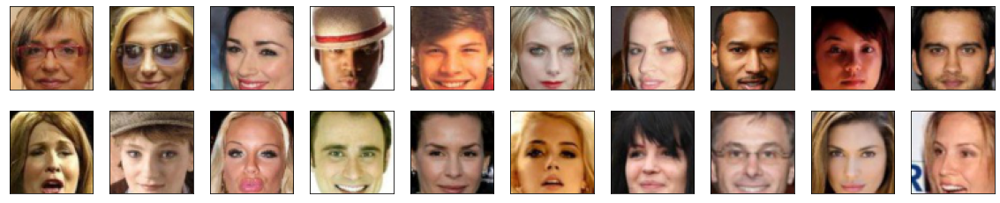

In [35]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [36]:
import torch.nn as nn
from torch.nn import Module

In [43]:
class Discriminator(Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
        input_feature_map = 64
        kernel = 4
        stride = 2
        padding = 1
        bias = False
        
        self.discriminator = nn.Sequential(
        nn.Conv2d(in_channels=3, out_channels=input_feature_map, kernel_size = kernel, stride=stride, padding=padding, bias = bias),
        nn.LeakyReLU(0.2, inplace=True),
            
        nn.Conv2d(in_channels=input_feature_map, out_channels=input_feature_map*2, kernel_size = kernel, stride=stride, padding=padding, bias = bias),
        nn.BatchNorm2d(128), nn.LeakyReLU(0.2, inplace=True), 
            
        nn.Conv2d(in_channels=input_feature_map*2, out_channels=input_feature_map*4, kernel_size = kernel, stride=stride, padding=padding, bias = bias),
        nn.BatchNorm2d(num_features=input_feature_map*4), nn.LeakyReLU(0.2, inplace=True), 
            
        nn.Conv2d(in_channels=input_feature_map*4, out_channels=input_feature_map*8, kernel_size = kernel, stride=stride, padding=padding, bias = bias),
        nn.BatchNorm2d(input_feature_map*8), nn.LeakyReLU(0.2, inplace=True),  
            
        nn.Conv2d(in_channels=input_feature_map*8, out_channels=1, kernel_size = kernel, stride=1, padding=0, bias = bias),
        nn.Sigmoid() 
        )
        
        
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.discriminator(x)
        return x 

In [44]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [57]:
class Generator(Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers
        input_feature_map = 64
        kernel = 4
        stride = 2
        padding = 1
        bias = False
        
        self.generator = nn.Sequential(
        nn.ConvTranspose2d(in_channels=latent_dim, out_channels=input_feature_map*8, kernel_size = 4, stride=1, padding=0, bias = bias),
        nn.BatchNorm2d(input_feature_map*8), nn.ReLU(True),
            
        nn.ConvTranspose2d(in_channels=input_feature_map*8, out_channels=input_feature_map*4, kernel_size = kernel, stride=stride, padding=padding, bias = bias),
        nn.BatchNorm2d(input_feature_map*4), nn.ReLU(True), 
            
        nn.ConvTranspose2d(in_channels=input_feature_map*4, out_channels=input_feature_map*2, kernel_size = kernel, stride=stride, padding=padding, bias = bias),
        nn.BatchNorm2d(input_feature_map*2), nn.ReLU(True), 
            
        nn.ConvTranspose2d(in_channels=input_feature_map*2, out_channels=input_feature_map, kernel_size = kernel, stride=stride, padding=padding, bias = bias),
        nn.BatchNorm2d(input_feature_map), nn.ReLU(True),  
            
        nn.ConvTranspose2d(in_channels=input_feature_map, out_channels=3, kernel_size = kernel, stride=stride, padding=padding, bias = bias),
        nn.Tanh() 
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.generator(x)
        return x

In [58]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [60]:
import torch.optim as optim


def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    learning_rate = 0.0001 # 0.0002, 0.00026, 0.0003
    beta1 = 0.3 # 0.4, 0.5
    beta2 = 0.987 # 0.990
    g_optimizer = optim.Adam(generator.parameters(), lr=learning_rate, betas=(beta1, beta2))
    d_optimizer = optim.Adam(discriminator.parameters(), lr=learning_rate, betas=(beta1, beta2))
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [61]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss 
    criterion = torch.nn.BCELoss()
    labels = torch.zeros(fake_logits.size()[0], 1).to(device)
    target_ones = torch.full((batch_size,1,1,1), 1, device=device,dtype=torch.float)
    loss = criterion(fake_logits, target_ones)
    return loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [63]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss 
    criterion = torch.nn.BCELoss()
    
    target_ones = torch.ones((batch_size, 1,1,1), device=device)
    
    target_zeros = torch.zeros((batch_size, 1,1,1), device=device)
    
    loss_actual = criterion(real_logits, target_ones)
    
    loss_actual.backward()
    D_r = real_logits.mean().item()
    loss_fake = criterion(fake_logits, target_zeros)

    loss_fake.backward()
    D_f = loss_fake.mean().item()
    
    loss = (loss_actual + loss_fake)
   
    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [ ]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [70]:
def generator_step(batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    vec = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    vec = torch.from_numpy(vec).float().cuda()
    fake_images = generator(vec) 
    g_optimizer.zero_grad()
    
    Img_fake = discriminator(fake_images)
    g_loss = generator_loss(Img_fake)
    
    g_loss.backward()
    g_optimizer.step()
    
    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    d_optimizer.zero_grad()
    
    target_ones = torch.ones((batch_size, 1), device=device)
    
    real_images = real_images.cuda()
    Img_real = discriminator(real_images)
    
    vec = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    vec = torch.from_numpy(vec).float().cuda()
    
    fake_images = generator(vec)
    target_zeroes = torch.full((batch_size,), 1, device=device,dtype=torch.float)
    
    Img_fake = discriminator(fake_images.detach())
    
    d_loss = discriminator_loss(Img_real, Img_fake)
    d_optimizer.step()
    
    real_sample = torch.randn(3, 32, 32)
    fake_sample = torch.randn(3, 32, 32)

    return {'loss': d_loss}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [71]:
from datetime import datetime

In [72]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 20

# number of images in each batch
batch_size = 64

In [73]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [74]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2024-10-21 16:00:47 | Epoch [1/20] | Batch 0/509 | d_loss: 1.6670 | g_loss: 1.2295
2024-10-21 16:00:53 | Epoch [1/20] | Batch 50/509 | d_loss: 0.0460 | g_loss: 6.7225
2024-10-21 16:00:59 | Epoch [1/20] | Batch 100/509 | d_loss: 1.5458 | g_loss: 19.3411
2024-10-21 16:01:06 | Epoch [1/20] | Batch 150/509 | d_loss: 0.1681 | g_loss: 3.4698
2024-10-21 16:01:13 | Epoch [1/20] | Batch 200/509 | d_loss: 0.4139 | g_loss: 5.3510
2024-10-21 16:01:19 | Epoch [1/20] | Batch 250/509 | d_loss: 0.4099 | g_loss: 6.0753
2024-10-21 16:01:26 | Epoch [1/20] | Batch 300/509 | d_loss: 0.1939 | g_loss: 3.9268
2024-10-21 16:01:33 | Epoch [1/20] | Batch 350/509 | d_loss: 1.6881 | g_loss: 9.4095
2024-10-21 16:01:39 | Epoch [1/20] | Batch 400/509 | d_loss: 0.2053 | g_loss: 3.4488
2024-10-21 16:01:46 | Epoch [1/20] | Batch 450/509 | d_loss: 0.2784 | g_loss: 3.0802
2024-10-21 16:01:53 | Epoch [1/20] | Batch 500/509 | d_loss: 0.0750 | g_loss: 4.2477


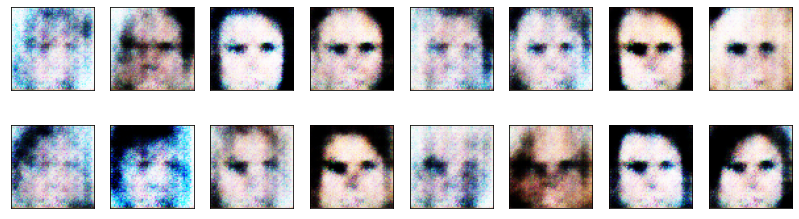

2024-10-21 16:01:58 | Epoch [2/20] | Batch 0/509 | d_loss: 0.1845 | g_loss: 5.9111
2024-10-21 16:02:05 | Epoch [2/20] | Batch 50/509 | d_loss: 0.1105 | g_loss: 4.2786
2024-10-21 16:02:11 | Epoch [2/20] | Batch 100/509 | d_loss: 0.2736 | g_loss: 5.7026
2024-10-21 16:02:18 | Epoch [2/20] | Batch 150/509 | d_loss: 0.2451 | g_loss: 4.2733
2024-10-21 16:02:25 | Epoch [2/20] | Batch 200/509 | d_loss: 0.1922 | g_loss: 3.8659
2024-10-21 16:02:31 | Epoch [2/20] | Batch 250/509 | d_loss: 0.3429 | g_loss: 2.0288
2024-10-21 16:02:38 | Epoch [2/20] | Batch 300/509 | d_loss: 0.1925 | g_loss: 3.8315
2024-10-21 16:02:45 | Epoch [2/20] | Batch 350/509 | d_loss: 0.3427 | g_loss: 3.2262
2024-10-21 16:02:51 | Epoch [2/20] | Batch 400/509 | d_loss: 0.2588 | g_loss: 4.1140
2024-10-21 16:02:58 | Epoch [2/20] | Batch 450/509 | d_loss: 1.1314 | g_loss: 1.4262
2024-10-21 16:03:05 | Epoch [2/20] | Batch 500/509 | d_loss: 0.3474 | g_loss: 5.0981


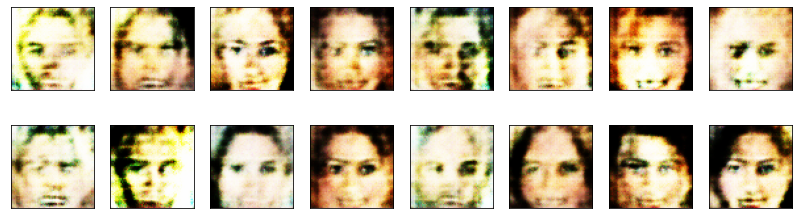

2024-10-21 16:03:10 | Epoch [3/20] | Batch 0/509 | d_loss: 0.3506 | g_loss: 3.0890
2024-10-21 16:03:17 | Epoch [3/20] | Batch 50/509 | d_loss: 0.1837 | g_loss: 4.0644
2024-10-21 16:03:24 | Epoch [3/20] | Batch 100/509 | d_loss: 0.2501 | g_loss: 3.9909
2024-10-21 16:03:31 | Epoch [3/20] | Batch 150/509 | d_loss: 1.5203 | g_loss: 1.2713
2024-10-21 16:03:38 | Epoch [3/20] | Batch 200/509 | d_loss: 0.1352 | g_loss: 3.5062
2024-10-21 16:03:44 | Epoch [3/20] | Batch 250/509 | d_loss: 0.4106 | g_loss: 2.3688
2024-10-21 16:03:51 | Epoch [3/20] | Batch 300/509 | d_loss: 0.1712 | g_loss: 3.2037
2024-10-21 16:03:58 | Epoch [3/20] | Batch 350/509 | d_loss: 0.2024 | g_loss: 3.4233
2024-10-21 16:04:04 | Epoch [3/20] | Batch 400/509 | d_loss: 0.2894 | g_loss: 2.4807
2024-10-21 16:04:11 | Epoch [3/20] | Batch 450/509 | d_loss: 0.1951 | g_loss: 4.6395
2024-10-21 16:04:18 | Epoch [3/20] | Batch 500/509 | d_loss: 0.2348 | g_loss: 2.6161


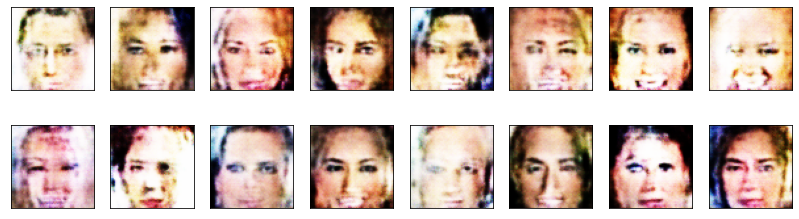

2024-10-21 16:04:24 | Epoch [4/20] | Batch 0/509 | d_loss: 0.4867 | g_loss: 3.9330
2024-10-21 16:04:30 | Epoch [4/20] | Batch 50/509 | d_loss: 0.5158 | g_loss: 2.2263
2024-10-21 16:04:37 | Epoch [4/20] | Batch 100/509 | d_loss: 0.9178 | g_loss: 6.4295
2024-10-21 16:04:44 | Epoch [4/20] | Batch 150/509 | d_loss: 0.2955 | g_loss: 2.9384
2024-10-21 16:04:50 | Epoch [4/20] | Batch 200/509 | d_loss: 2.0950 | g_loss: 1.1384
2024-10-21 16:04:57 | Epoch [4/20] | Batch 250/509 | d_loss: 1.5655 | g_loss: 1.4644
2024-10-21 16:05:04 | Epoch [4/20] | Batch 300/509 | d_loss: 0.2291 | g_loss: 4.8156
2024-10-21 16:05:11 | Epoch [4/20] | Batch 350/509 | d_loss: 2.0100 | g_loss: 1.3404
2024-10-21 16:05:17 | Epoch [4/20] | Batch 400/509 | d_loss: 0.5153 | g_loss: 4.1372
2024-10-21 16:05:24 | Epoch [4/20] | Batch 450/509 | d_loss: 0.7271 | g_loss: 0.9317
2024-10-21 16:05:31 | Epoch [4/20] | Batch 500/509 | d_loss: 1.0522 | g_loss: 4.5050


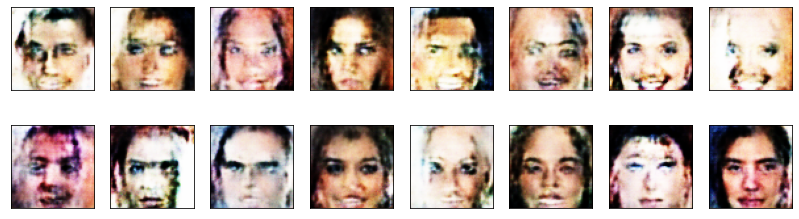

2024-10-21 16:05:35 | Epoch [5/20] | Batch 0/509 | d_loss: 0.5448 | g_loss: 1.6903
2024-10-21 16:05:42 | Epoch [5/20] | Batch 50/509 | d_loss: 0.3729 | g_loss: 2.1268
2024-10-21 16:05:49 | Epoch [5/20] | Batch 100/509 | d_loss: 0.3286 | g_loss: 2.7336
2024-10-21 16:05:56 | Epoch [5/20] | Batch 150/509 | d_loss: 0.2478 | g_loss: 3.2082
2024-10-21 16:06:02 | Epoch [5/20] | Batch 200/509 | d_loss: 0.3914 | g_loss: 1.6795
2024-10-21 16:06:09 | Epoch [5/20] | Batch 250/509 | d_loss: 0.2992 | g_loss: 3.3037
2024-10-21 16:06:16 | Epoch [5/20] | Batch 300/509 | d_loss: 0.2618 | g_loss: 2.7893
2024-10-21 16:06:23 | Epoch [5/20] | Batch 350/509 | d_loss: 0.6816 | g_loss: 2.2536
2024-10-21 16:06:29 | Epoch [5/20] | Batch 400/509 | d_loss: 0.4006 | g_loss: 1.9625
2024-10-21 16:06:36 | Epoch [5/20] | Batch 450/509 | d_loss: 1.1571 | g_loss: 4.7572
2024-10-21 16:06:43 | Epoch [5/20] | Batch 500/509 | d_loss: 0.3161 | g_loss: 3.7369


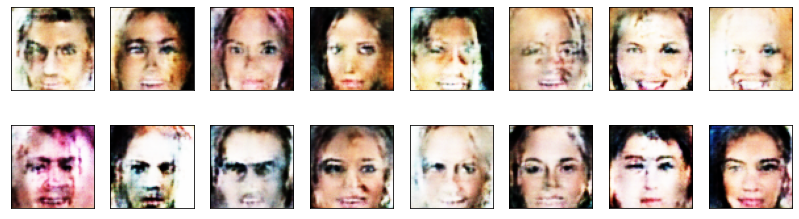

2024-10-21 16:06:48 | Epoch [6/20] | Batch 0/509 | d_loss: 0.2847 | g_loss: 3.1369
2024-10-21 16:06:54 | Epoch [6/20] | Batch 50/509 | d_loss: 0.1425 | g_loss: 3.1597
2024-10-21 16:07:01 | Epoch [6/20] | Batch 100/509 | d_loss: 0.3015 | g_loss: 3.0806
2024-10-21 16:07:07 | Epoch [6/20] | Batch 150/509 | d_loss: 0.5792 | g_loss: 1.6804
2024-10-21 16:07:14 | Epoch [6/20] | Batch 200/509 | d_loss: 0.3479 | g_loss: 1.8812
2024-10-21 16:07:21 | Epoch [6/20] | Batch 250/509 | d_loss: 0.2240 | g_loss: 2.5887
2024-10-21 16:07:28 | Epoch [6/20] | Batch 300/509 | d_loss: 0.2270 | g_loss: 2.6806
2024-10-21 16:07:34 | Epoch [6/20] | Batch 350/509 | d_loss: 0.3657 | g_loss: 3.3315
2024-10-21 16:07:41 | Epoch [6/20] | Batch 400/509 | d_loss: 0.3080 | g_loss: 5.1867
2024-10-21 16:07:47 | Epoch [6/20] | Batch 450/509 | d_loss: 0.3179 | g_loss: 3.5914
2024-10-21 16:07:54 | Epoch [6/20] | Batch 500/509 | d_loss: 0.2110 | g_loss: 3.2097


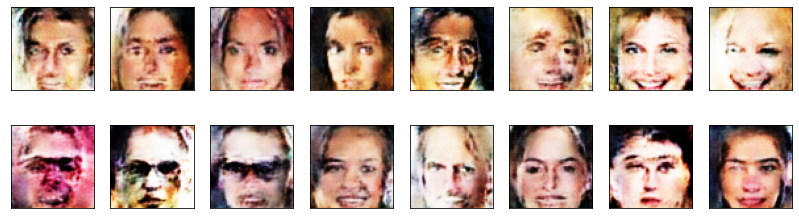

2024-10-21 16:07:59 | Epoch [7/20] | Batch 0/509 | d_loss: 0.2224 | g_loss: 2.4167
2024-10-21 16:08:06 | Epoch [7/20] | Batch 50/509 | d_loss: 0.2205 | g_loss: 2.7217
2024-10-21 16:08:13 | Epoch [7/20] | Batch 100/509 | d_loss: 0.4485 | g_loss: 1.1788
2024-10-21 16:08:19 | Epoch [7/20] | Batch 150/509 | d_loss: 0.1425 | g_loss: 3.1185
2024-10-21 16:08:26 | Epoch [7/20] | Batch 200/509 | d_loss: 0.1989 | g_loss: 4.1301
2024-10-21 16:08:33 | Epoch [7/20] | Batch 250/509 | d_loss: 1.4248 | g_loss: 10.0442
2024-10-21 16:08:39 | Epoch [7/20] | Batch 300/509 | d_loss: 0.2524 | g_loss: 2.5514
2024-10-21 16:08:46 | Epoch [7/20] | Batch 350/509 | d_loss: 0.2985 | g_loss: 3.1160
2024-10-21 16:08:53 | Epoch [7/20] | Batch 400/509 | d_loss: 0.4734 | g_loss: 3.8202
2024-10-21 16:08:59 | Epoch [7/20] | Batch 450/509 | d_loss: 0.3482 | g_loss: 4.2691
2024-10-21 16:09:06 | Epoch [7/20] | Batch 500/509 | d_loss: 0.1371 | g_loss: 3.6664


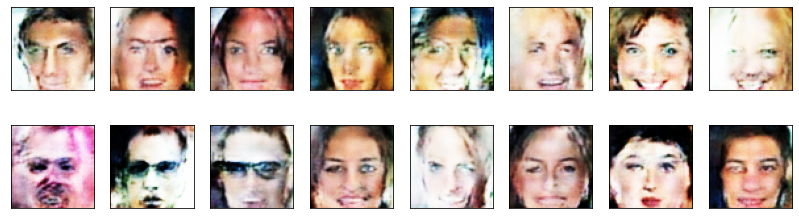

2024-10-21 16:09:11 | Epoch [8/20] | Batch 0/509 | d_loss: 0.3387 | g_loss: 1.3297
2024-10-21 16:09:18 | Epoch [8/20] | Batch 50/509 | d_loss: 0.1711 | g_loss: 2.8954
2024-10-21 16:09:24 | Epoch [8/20] | Batch 100/509 | d_loss: 0.1713 | g_loss: 2.8576
2024-10-21 16:09:31 | Epoch [8/20] | Batch 150/509 | d_loss: 0.2883 | g_loss: 3.5465
2024-10-21 16:09:38 | Epoch [8/20] | Batch 200/509 | d_loss: 0.1933 | g_loss: 2.4888
2024-10-21 16:09:45 | Epoch [8/20] | Batch 250/509 | d_loss: 0.2001 | g_loss: 4.0776
2024-10-21 16:09:51 | Epoch [8/20] | Batch 300/509 | d_loss: 0.1839 | g_loss: 3.3317
2024-10-21 16:09:58 | Epoch [8/20] | Batch 350/509 | d_loss: 0.2324 | g_loss: 4.1181
2024-10-21 16:10:05 | Epoch [8/20] | Batch 400/509 | d_loss: 0.1989 | g_loss: 4.1743
2024-10-21 16:10:11 | Epoch [8/20] | Batch 450/509 | d_loss: 0.4648 | g_loss: 4.2067
2024-10-21 16:10:18 | Epoch [8/20] | Batch 500/509 | d_loss: 0.1234 | g_loss: 3.4033


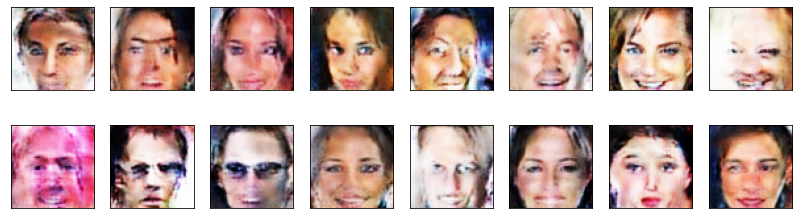

2024-10-21 16:10:23 | Epoch [9/20] | Batch 0/509 | d_loss: 0.2579 | g_loss: 4.7359
2024-10-21 16:10:31 | Epoch [9/20] | Batch 50/509 | d_loss: 0.1951 | g_loss: 4.9330
2024-10-21 16:10:37 | Epoch [9/20] | Batch 100/509 | d_loss: 0.1591 | g_loss: 3.2124
2024-10-21 16:10:44 | Epoch [9/20] | Batch 150/509 | d_loss: 0.1007 | g_loss: 3.6643
2024-10-21 16:10:50 | Epoch [9/20] | Batch 200/509 | d_loss: 0.1722 | g_loss: 2.6372
2024-10-21 16:10:57 | Epoch [9/20] | Batch 250/509 | d_loss: 0.2677 | g_loss: 3.7775
2024-10-21 16:11:04 | Epoch [9/20] | Batch 300/509 | d_loss: 0.3325 | g_loss: 3.4410
2024-10-21 16:11:11 | Epoch [9/20] | Batch 350/509 | d_loss: 1.3777 | g_loss: 8.2255
2024-10-21 16:11:18 | Epoch [9/20] | Batch 400/509 | d_loss: 0.2543 | g_loss: 2.4253
2024-10-21 16:11:24 | Epoch [9/20] | Batch 450/509 | d_loss: 0.2061 | g_loss: 4.0371
2024-10-21 16:11:31 | Epoch [9/20] | Batch 500/509 | d_loss: 0.2962 | g_loss: 2.2295


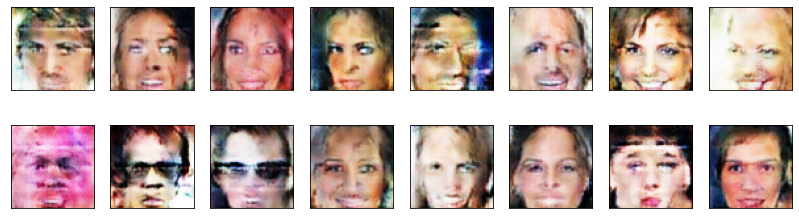

2024-10-21 16:11:36 | Epoch [10/20] | Batch 0/509 | d_loss: 0.1361 | g_loss: 3.9668
2024-10-21 16:11:43 | Epoch [10/20] | Batch 50/509 | d_loss: 0.2342 | g_loss: 3.8704
2024-10-21 16:11:49 | Epoch [10/20] | Batch 100/509 | d_loss: 0.1694 | g_loss: 3.0740
2024-10-21 16:11:56 | Epoch [10/20] | Batch 150/509 | d_loss: 0.2692 | g_loss: 2.8035
2024-10-21 16:12:03 | Epoch [10/20] | Batch 200/509 | d_loss: 0.3481 | g_loss: 4.2780
2024-10-21 16:12:09 | Epoch [10/20] | Batch 250/509 | d_loss: 0.1795 | g_loss: 3.8546
2024-10-21 16:12:16 | Epoch [10/20] | Batch 300/509 | d_loss: 0.1272 | g_loss: 4.1245
2024-10-21 16:12:23 | Epoch [10/20] | Batch 350/509 | d_loss: 0.2402 | g_loss: 2.8335
2024-10-21 16:12:29 | Epoch [10/20] | Batch 400/509 | d_loss: 0.9505 | g_loss: 6.3957
2024-10-21 16:12:36 | Epoch [10/20] | Batch 450/509 | d_loss: 0.2421 | g_loss: 4.5816
2024-10-21 16:12:43 | Epoch [10/20] | Batch 500/509 | d_loss: 0.2225 | g_loss: 3.8729


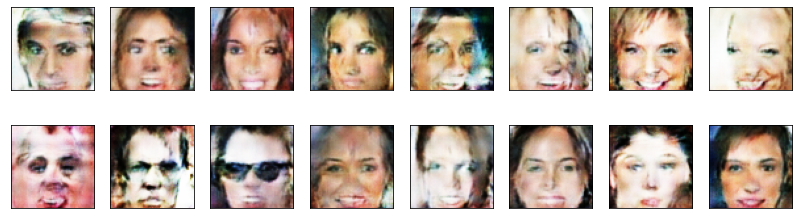

2024-10-21 16:12:49 | Epoch [11/20] | Batch 0/509 | d_loss: 0.2455 | g_loss: 4.9176
2024-10-21 16:12:56 | Epoch [11/20] | Batch 50/509 | d_loss: 0.2021 | g_loss: 2.9541
2024-10-21 16:13:02 | Epoch [11/20] | Batch 100/509 | d_loss: 0.1377 | g_loss: 3.1545
2024-10-21 16:13:09 | Epoch [11/20] | Batch 150/509 | d_loss: 0.1690 | g_loss: 3.2491
2024-10-21 16:13:15 | Epoch [11/20] | Batch 200/509 | d_loss: 0.1940 | g_loss: 4.3724
2024-10-21 16:13:22 | Epoch [11/20] | Batch 250/509 | d_loss: 0.1009 | g_loss: 3.6576
2024-10-21 16:13:29 | Epoch [11/20] | Batch 300/509 | d_loss: 0.1535 | g_loss: 3.2911
2024-10-21 16:13:36 | Epoch [11/20] | Batch 350/509 | d_loss: 0.2332 | g_loss: 3.3889
2024-10-21 16:13:42 | Epoch [11/20] | Batch 400/509 | d_loss: 0.3456 | g_loss: 4.0114
2024-10-21 16:13:49 | Epoch [11/20] | Batch 450/509 | d_loss: 2.7081 | g_loss: 0.5491
2024-10-21 16:13:56 | Epoch [11/20] | Batch 500/509 | d_loss: 0.2336 | g_loss: 2.2665


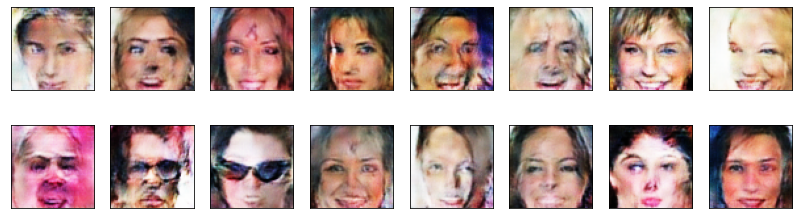

2024-10-21 16:14:00 | Epoch [12/20] | Batch 0/509 | d_loss: 0.9904 | g_loss: 9.7582
2024-10-21 16:14:07 | Epoch [12/20] | Batch 50/509 | d_loss: 0.1851 | g_loss: 2.7308
2024-10-21 16:14:14 | Epoch [12/20] | Batch 100/509 | d_loss: 0.1915 | g_loss: 3.7628
2024-10-21 16:14:20 | Epoch [12/20] | Batch 150/509 | d_loss: 0.2561 | g_loss: 5.3362
2024-10-21 16:14:27 | Epoch [12/20] | Batch 200/509 | d_loss: 0.1092 | g_loss: 3.4713
2024-10-21 16:14:33 | Epoch [12/20] | Batch 250/509 | d_loss: 0.5558 | g_loss: 5.3367
2024-10-21 16:14:40 | Epoch [12/20] | Batch 300/509 | d_loss: 0.3459 | g_loss: 3.9163
2024-10-21 16:14:47 | Epoch [12/20] | Batch 350/509 | d_loss: 0.1228 | g_loss: 4.4254
2024-10-21 16:14:54 | Epoch [12/20] | Batch 400/509 | d_loss: 0.2253 | g_loss: 4.1895
2024-10-21 16:15:00 | Epoch [12/20] | Batch 450/509 | d_loss: 0.8147 | g_loss: 3.7007
2024-10-21 16:15:07 | Epoch [12/20] | Batch 500/509 | d_loss: 0.4934 | g_loss: 4.8550


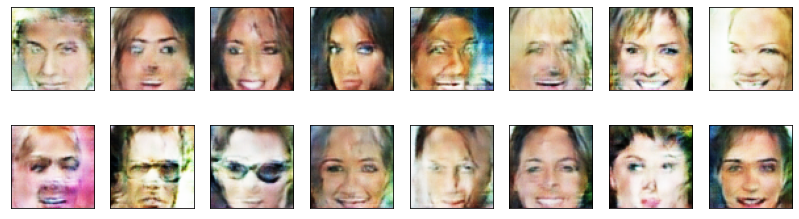

2024-10-21 16:15:12 | Epoch [13/20] | Batch 0/509 | d_loss: 0.2226 | g_loss: 3.3784
2024-10-21 16:15:19 | Epoch [13/20] | Batch 50/509 | d_loss: 0.1172 | g_loss: 3.8657
2024-10-21 16:15:26 | Epoch [13/20] | Batch 100/509 | d_loss: 0.1602 | g_loss: 3.2911
2024-10-21 16:15:32 | Epoch [13/20] | Batch 150/509 | d_loss: 0.2440 | g_loss: 3.1318
2024-10-21 16:15:39 | Epoch [13/20] | Batch 200/509 | d_loss: 0.2702 | g_loss: 2.4536
2024-10-21 16:15:45 | Epoch [13/20] | Batch 250/509 | d_loss: 0.1596 | g_loss: 3.4729
2024-10-21 16:15:52 | Epoch [13/20] | Batch 300/509 | d_loss: 0.3072 | g_loss: 2.0385
2024-10-21 16:15:59 | Epoch [13/20] | Batch 350/509 | d_loss: 0.1731 | g_loss: 4.1071
2024-10-21 16:16:05 | Epoch [13/20] | Batch 400/509 | d_loss: 0.2359 | g_loss: 4.7774
2024-10-21 16:16:12 | Epoch [13/20] | Batch 450/509 | d_loss: 0.0965 | g_loss: 3.6985
2024-10-21 16:16:19 | Epoch [13/20] | Batch 500/509 | d_loss: 0.6038 | g_loss: 5.1450


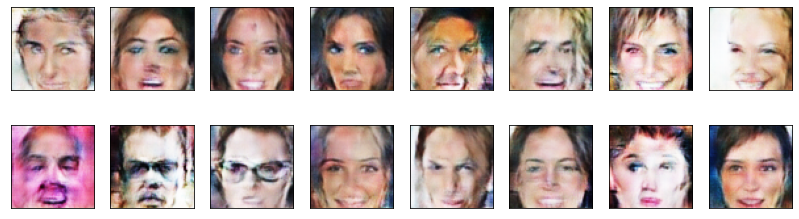

2024-10-21 16:16:24 | Epoch [14/20] | Batch 0/509 | d_loss: 0.1838 | g_loss: 4.3358
2024-10-21 16:16:30 | Epoch [14/20] | Batch 50/509 | d_loss: 0.2436 | g_loss: 4.0098
2024-10-21 16:16:37 | Epoch [14/20] | Batch 100/509 | d_loss: 0.1852 | g_loss: 4.7298
2024-10-21 16:16:44 | Epoch [14/20] | Batch 150/509 | d_loss: 0.1995 | g_loss: 3.3989
2024-10-21 16:16:50 | Epoch [14/20] | Batch 200/509 | d_loss: 0.1883 | g_loss: 5.0713
2024-10-21 16:16:57 | Epoch [14/20] | Batch 250/509 | d_loss: 0.1631 | g_loss: 3.4573
2024-10-21 16:17:03 | Epoch [14/20] | Batch 300/509 | d_loss: 0.1345 | g_loss: 4.5871
2024-10-21 16:17:10 | Epoch [14/20] | Batch 350/509 | d_loss: 0.2791 | g_loss: 4.5809
2024-10-21 16:17:17 | Epoch [14/20] | Batch 400/509 | d_loss: 0.3332 | g_loss: 6.8192
2024-10-21 16:17:23 | Epoch [14/20] | Batch 450/509 | d_loss: 0.1201 | g_loss: 4.3858
2024-10-21 16:17:31 | Epoch [14/20] | Batch 500/509 | d_loss: 0.0970 | g_loss: 4.3022


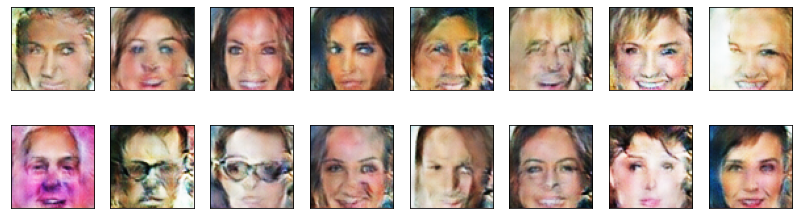

2024-10-21 16:17:36 | Epoch [15/20] | Batch 0/509 | d_loss: 0.1102 | g_loss: 4.2082
2024-10-21 16:17:43 | Epoch [15/20] | Batch 50/509 | d_loss: 0.1087 | g_loss: 4.4103
2024-10-21 16:17:49 | Epoch [15/20] | Batch 100/509 | d_loss: 0.4275 | g_loss: 5.6190
2024-10-21 16:17:56 | Epoch [15/20] | Batch 150/509 | d_loss: 0.1812 | g_loss: 3.6000
2024-10-21 16:18:03 | Epoch [15/20] | Batch 200/509 | d_loss: 0.2383 | g_loss: 2.9263
2024-10-21 16:18:10 | Epoch [15/20] | Batch 250/509 | d_loss: 0.1640 | g_loss: 3.2388
2024-10-21 16:18:16 | Epoch [15/20] | Batch 300/509 | d_loss: 0.2089 | g_loss: 5.0490
2024-10-21 16:18:23 | Epoch [15/20] | Batch 350/509 | d_loss: 0.2529 | g_loss: 5.0564
2024-10-21 16:18:30 | Epoch [15/20] | Batch 400/509 | d_loss: 0.3596 | g_loss: 4.1629
2024-10-21 16:18:36 | Epoch [15/20] | Batch 450/509 | d_loss: 0.1758 | g_loss: 3.7306
2024-10-21 16:18:43 | Epoch [15/20] | Batch 500/509 | d_loss: 0.5918 | g_loss: 6.6862


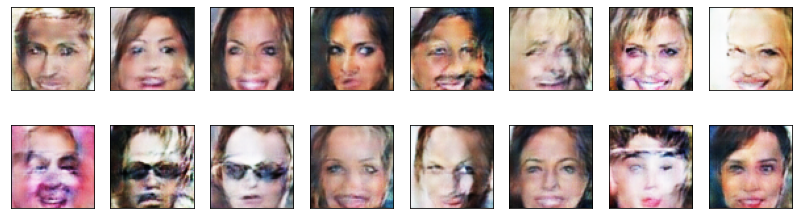

2024-10-21 16:18:48 | Epoch [16/20] | Batch 0/509 | d_loss: 2.0811 | g_loss: 1.7873
2024-10-21 16:18:55 | Epoch [16/20] | Batch 50/509 | d_loss: 0.6910 | g_loss: 5.8589
2024-10-21 16:19:02 | Epoch [16/20] | Batch 100/509 | d_loss: 0.1935 | g_loss: 3.9783
2024-10-21 16:19:08 | Epoch [16/20] | Batch 150/509 | d_loss: 0.4613 | g_loss: 1.6292
2024-10-21 16:19:15 | Epoch [16/20] | Batch 200/509 | d_loss: 6.1575 | g_loss: 2.5690
2024-10-21 16:19:22 | Epoch [16/20] | Batch 250/509 | d_loss: 0.0816 | g_loss: 3.9152
2024-10-21 16:19:29 | Epoch [16/20] | Batch 300/509 | d_loss: 0.1849 | g_loss: 3.2742
2024-10-21 16:19:36 | Epoch [16/20] | Batch 350/509 | d_loss: 0.8982 | g_loss: 2.7746
2024-10-21 16:19:42 | Epoch [16/20] | Batch 400/509 | d_loss: 0.2491 | g_loss: 4.6952
2024-10-21 16:19:50 | Epoch [16/20] | Batch 450/509 | d_loss: 0.1615 | g_loss: 2.8153
2024-10-21 16:19:56 | Epoch [16/20] | Batch 500/509 | d_loss: 0.2929 | g_loss: 3.8739


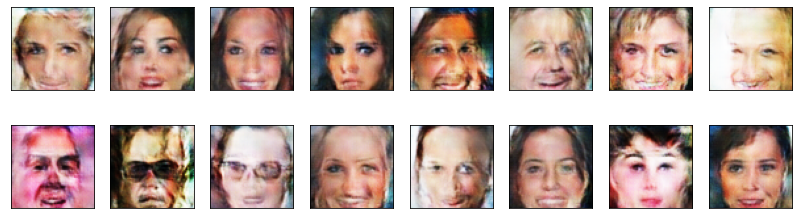

2024-10-21 16:20:01 | Epoch [17/20] | Batch 0/509 | d_loss: 0.3811 | g_loss: 4.1584
2024-10-21 16:20:08 | Epoch [17/20] | Batch 50/509 | d_loss: 0.2899 | g_loss: 3.2791
2024-10-21 16:20:14 | Epoch [17/20] | Batch 100/509 | d_loss: 0.2016 | g_loss: 4.2236
2024-10-21 16:20:21 | Epoch [17/20] | Batch 150/509 | d_loss: 0.1935 | g_loss: 4.4816
2024-10-21 16:20:28 | Epoch [17/20] | Batch 200/509 | d_loss: 0.2105 | g_loss: 3.1442
2024-10-21 16:20:34 | Epoch [17/20] | Batch 250/509 | d_loss: 0.2906 | g_loss: 2.1295
2024-10-21 16:20:41 | Epoch [17/20] | Batch 300/509 | d_loss: 0.3236 | g_loss: 8.6231
2024-10-21 16:20:48 | Epoch [17/20] | Batch 350/509 | d_loss: 0.0959 | g_loss: 3.2202
2024-10-21 16:20:54 | Epoch [17/20] | Batch 400/509 | d_loss: 0.1393 | g_loss: 2.6140
2024-10-21 16:21:01 | Epoch [17/20] | Batch 450/509 | d_loss: 0.0709 | g_loss: 4.2484
2024-10-21 16:21:08 | Epoch [17/20] | Batch 500/509 | d_loss: 0.3214 | g_loss: 3.1435


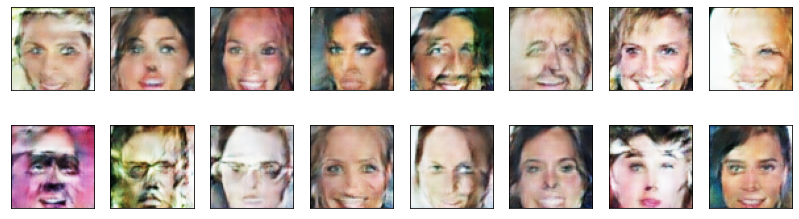

2024-10-21 16:21:14 | Epoch [18/20] | Batch 0/509 | d_loss: 0.1526 | g_loss: 4.5583
2024-10-21 16:21:21 | Epoch [18/20] | Batch 50/509 | d_loss: 0.3272 | g_loss: 2.7287
2024-10-21 16:21:27 | Epoch [18/20] | Batch 100/509 | d_loss: 0.1799 | g_loss: 4.5471
2024-10-21 16:21:34 | Epoch [18/20] | Batch 150/509 | d_loss: 0.3242 | g_loss: 2.5033
2024-10-21 16:21:41 | Epoch [18/20] | Batch 200/509 | d_loss: 0.5226 | g_loss: 11.2466
2024-10-21 16:21:47 | Epoch [18/20] | Batch 250/509 | d_loss: 0.2843 | g_loss: 3.2261
2024-10-21 16:21:54 | Epoch [18/20] | Batch 300/509 | d_loss: 0.1336 | g_loss: 2.9673
2024-10-21 16:22:01 | Epoch [18/20] | Batch 350/509 | d_loss: 4.0417 | g_loss: 3.1503
2024-10-21 16:22:08 | Epoch [18/20] | Batch 400/509 | d_loss: 0.1120 | g_loss: 3.7509
2024-10-21 16:22:15 | Epoch [18/20] | Batch 450/509 | d_loss: 0.2652 | g_loss: 3.2966
2024-10-21 16:22:22 | Epoch [18/20] | Batch 500/509 | d_loss: 0.3679 | g_loss: 6.1540


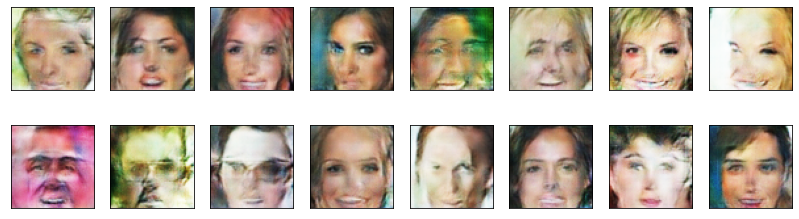

2024-10-21 16:22:28 | Epoch [19/20] | Batch 0/509 | d_loss: 0.0743 | g_loss: 4.6073
2024-10-21 16:22:34 | Epoch [19/20] | Batch 50/509 | d_loss: 0.1196 | g_loss: 5.0564
2024-10-21 16:22:41 | Epoch [19/20] | Batch 100/509 | d_loss: 0.0380 | g_loss: 4.7605
2024-10-21 16:22:48 | Epoch [19/20] | Batch 150/509 | d_loss: 0.0832 | g_loss: 3.9461
2024-10-21 16:22:54 | Epoch [19/20] | Batch 200/509 | d_loss: 1.3380 | g_loss: 1.2217
2024-10-21 16:23:01 | Epoch [19/20] | Batch 250/509 | d_loss: 0.1308 | g_loss: 3.1810
2024-10-21 16:23:08 | Epoch [19/20] | Batch 300/509 | d_loss: 0.1529 | g_loss: 4.8727
2024-10-21 16:23:14 | Epoch [19/20] | Batch 350/509 | d_loss: 0.0663 | g_loss: 4.3622
2024-10-21 16:23:21 | Epoch [19/20] | Batch 400/509 | d_loss: 0.1588 | g_loss: 4.0077
2024-10-21 16:23:28 | Epoch [19/20] | Batch 450/509 | d_loss: 0.6025 | g_loss: 4.6075
2024-10-21 16:23:35 | Epoch [19/20] | Batch 500/509 | d_loss: 0.0660 | g_loss: 4.6366


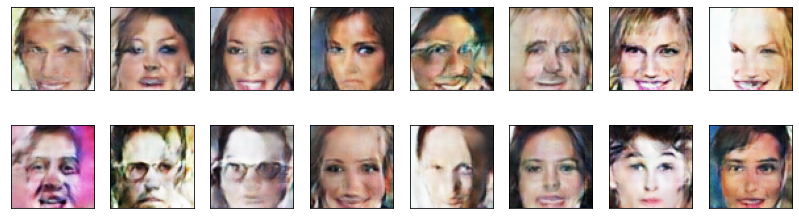

2024-10-21 16:23:41 | Epoch [20/20] | Batch 0/509 | d_loss: 0.0831 | g_loss: 4.4549
2024-10-21 16:23:47 | Epoch [20/20] | Batch 50/509 | d_loss: 0.4113 | g_loss: 5.2127
2024-10-21 16:23:54 | Epoch [20/20] | Batch 100/509 | d_loss: 0.0609 | g_loss: 4.2315
2024-10-21 16:24:00 | Epoch [20/20] | Batch 150/509 | d_loss: 0.0633 | g_loss: 4.0343
2024-10-21 16:24:07 | Epoch [20/20] | Batch 200/509 | d_loss: 0.2925 | g_loss: 5.2712
2024-10-21 16:24:14 | Epoch [20/20] | Batch 250/509 | d_loss: 0.8002 | g_loss: 2.2595
2024-10-21 16:24:21 | Epoch [20/20] | Batch 300/509 | d_loss: 0.0310 | g_loss: 4.6238
2024-10-21 16:24:28 | Epoch [20/20] | Batch 350/509 | d_loss: 0.0785 | g_loss: 4.2795
2024-10-21 16:24:35 | Epoch [20/20] | Batch 400/509 | d_loss: 0.3331 | g_loss: 2.5976
2024-10-21 16:24:42 | Epoch [20/20] | Batch 450/509 | d_loss: 0.0804 | g_loss: 4.4813
2024-10-21 16:24:48 | Epoch [20/20] | Batch 500/509 | d_loss: 0.1047 | g_loss: 5.0912


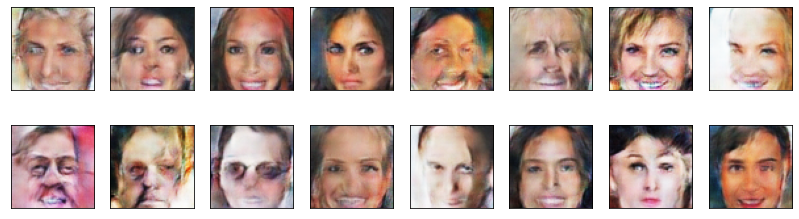

In [75]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        
        ####################################
        
        # TODO: implement the training strategy
        batch_size = real_images.size(0)
        
        d_optimizer.zero_grad()
        d_loss = discriminator_step(batch_size, latent_dim, real_images)
      
        g_optimizer.zero_grad()
        g_loss = generator_step(batch_size, latent_dim)  
        
        ####################################
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

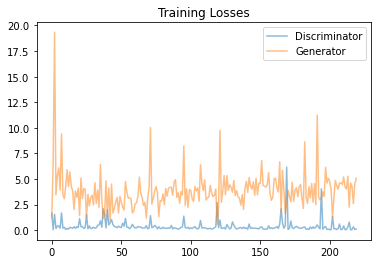

In [76]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**The data set may be biased, as displayed by the glowing appearance of white pixels on the faces, which appears unnatural. The model's size are adequate. I would like to experiment with a superior-quality dataset. I believe Adam is adequate as the optimiser; nevertheless, I will experiment with a new optimiser once it is accessible. I concur that five epochs are insufficient. Should time allow, I would prefer to attempt a minimum of 100 epochs. The loss function works pretty well I think.**

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.

# FINISHED